In [1]:
# import packages
import json
import numpy as np
import seaborn as sns
import statsmodels.api as sms
import matplotlib.cm as cm
import os
import pandas as pd
import geopandas as gpd
import re
import string
import unicodedata
from bs4 import BeautifulSoup
import geopandas
import contextily as cx
from geopandas import GeoDataFrame

from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt
import pysal as ps
import plotly.express as px
import pandas as pd
from sklearn.linear_model import LinearRegression
import statsmodels.api as sm
import sklearn
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix

import seaborn as sn
import matplotlib as mpl
# import libpysal as ps
from mgwr.gwr import GWR, MGWR
from mgwr.sel_bw import Sel_BW
from mgwr.utils import shift_colormap, truncate_colormap

from sklearn.preprocessing import OneHotEncoder # We don't use this but I point out where you *could*
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.decomposition import LatentDirichletAllocation

import nltk
import spacy
nltk.download('wordnet')
nltk.download('averaged_perceptron_tagger')
from nltk.corpus import wordnet as wn
from nltk.stem.wordnet import WordNetLemmatizer

from nltk.corpus import stopwords
stopword_list = set(stopwords.words('english'))

from nltk.tokenize import word_tokenize, sent_tokenize
from nltk.tokenize.toktok import ToktokTokenizer
#from nltk.tokenize.stanford import StanfordTokenizer

from nltk.stem.porter import PorterStemmer
from nltk.stem.snowball import SnowballStemmer

from nltk import ngrams, FreqDist

lemmatizer = WordNetLemmatizer()
tokenizer = ToktokTokenizer()


[nltk_data] Downloading package wordnet to /home/jovyan/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /home/jovyan/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!


In [2]:
from IPython.display import display_markdown

def as_markdown(head='', body='Some body text'):
    if head != '':
        display_markdown(f"##### {head}\n\n>{body}\n", raw=True)
    else:
        display_markdown(f">{body}\n", raw=True)

In [3]:
# read airbnb data
a_2108 = pd.read_csv('./data/listings_2021_8.csv')
a_2108['price'] = a_2108.price.str.replace('$','').str.replace(',','').astype(float)

a_2112 = pd.read_csv('./data/listings_2021_12.csv')
a_2112['price'] = a_2112.price.str.replace('$','').str.replace(',','').astype(float)

a_2203 = pd.read_csv('./data/listings_22_03.csv')
a_2203['price'] = a_2203.price.str.replace('$','').str.replace(',','').astype(float)


# read in poi data
mall = pd.read_excel('data/poi_excel/mall.xls')
bus = pd.read_excel('data/poi_excel/bus.xls')
tube = pd.read_excel('data/poi_excel/tube.xls')
park = pd.read_excel('data/poi_excel/park.xls')
school = pd.read_excel('data/poi_excel/school.xls')
attractions = pd.read_excel('data/poi_excel/attrac.xls')
train = pd.read_excel('data/poi_excel/train.xls')
office = pd.read_excel('data/poi_excel/office.xls')

#read in shanghai rental price
r_price = pd.read_csv('./data/lianjia_house_leasing.csv')

#read in shp file
sssh = gpd.read_file('final_sh.geojson')

/tmp/ipykernel_4118/557777091.py:3: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.
  a_2108['price'] = a_2108.price.str.replace('$','').str.replace(',','').astype(float)
/tmp/ipykernel_4118/557777091.py:6: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.
  a_2112['price'] = a_2112.price.str.replace('$','').str.replace(',','').astype(float)
/tmp/ipykernel_4118/557777091.py:9: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.
  a_2203['price'] = a_2203.price.str.replace('$','').str.replace(',','').astype(float)


# Clean Data

## Airbnb Data

In [4]:
#keep only needed data for regression
a_2108_1 = a_2108[['id', 'host_id','room_type','neighbourhood_cleansed',
                   'review_scores_value','latitude','longitude','price',
                   'accommodates','bathrooms_text','bedrooms','beds','amenities']]
a_2108_1

,id,host_id,room_type,neighbourhood_cleansed,review_scores_value,latitude,longitude,price,accommodates,bathrooms_text,bedrooms,beds,amenities
0,24963,98203,Entire home/apt,徐汇区 / Xuhui District,4.76,31.210730,121.451590,480.0,3,1 bath,1.0,2.0,"[""Smoke alarm"", ""Shampoo"", ""Paid parking off p..."
1,322045,681552,Entire home/apt,静安区 / Jing'an District,4.56,31.242400,121.444490,464.0,2,1 bath,1.0,1.0,"[""Smoke alarm"", ""Shampoo"", ""Paid parking off p..."
2,402315,681552,Entire home/apt,静安区 / Jing'an District,4.76,31.242870,121.443550,445.0,2,1 bath,1.0,1.0,"[""Smoke alarm"", ""Shampoo"", ""Paid parking off p..."
3,479499,681552,Entire home/apt,静安区 / Jing'an District,4.42,31.243660,121.443960,464.0,2,1 bath,1.0,1.0,"[""Smoke alarm"", ""Shampoo"", ""Paid parking off p..."
4,479506,681552,Entire home/apt,静安区 / Jing'an District,4.76,31.242110,121.442590,407.0,2,1 bath,1.0,1.0,"[""Smoke alarm"", ""Shampoo"", ""Paid parking off p..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...
27800,52504269,422241715,Entire home/apt,松江区 / Songjiang District,NaN,31.141783,121.327689,120.0,2,1 bath,NaN,1.0,"[""Dryer"", ""TV"", ""Elevator"", ""Fire extinguisher..."
27801,52505271,161080396,Private room,静安区 / Jing'an District,NaN,31.238201,121.446381,555.0,2,1 bath,1.0,2.0,"[""Dryer"", ""Smoke alarm"", ""Private entrance"", ""..."
27802,52505580,161080396,Entire home/apt,静安区 / Jing'an District,NaN,31.238201,121.446381,555.0,2,1 bath,1.0,2.0,"[""Private entrance"", ""Smoke alarm"", ""TV"", ""Ess..."
27803,52506106,161080396,Private room,静安区 / Jing'an District,NaN,31.263439,121.460289,555.0,2,1 bath,1.0,2.0,"[""Smoke alarm"", ""Shampoo"", ""Gym"", ""Breakfast"",..."


In [5]:
a_2108_1['amenities_count'] = a_2108_1.amenities.str.count(',')
a_2108_1

/opt/conda/envs/sds2021/lib/python3.9/site-packages/pandas/core/frame.py:3607: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._set_item(key, value)


,id,host_id,room_type,neighbourhood_cleansed,review_scores_value,latitude,longitude,price,accommodates,bathrooms_text,bedrooms,beds,amenities,amenities_count
0,24963,98203,Entire home/apt,徐汇区 / Xuhui District,4.76,31.210730,121.451590,480.0,3,1 bath,1.0,2.0,"[""Smoke alarm"", ""Shampoo"", ""Paid parking off p...",32
1,322045,681552,Entire home/apt,静安区 / Jing'an District,4.56,31.242400,121.444490,464.0,2,1 bath,1.0,1.0,"[""Smoke alarm"", ""Shampoo"", ""Paid parking off p...",24
2,402315,681552,Entire home/apt,静安区 / Jing'an District,4.76,31.242870,121.443550,445.0,2,1 bath,1.0,1.0,"[""Smoke alarm"", ""Shampoo"", ""Paid parking off p...",27
3,479499,681552,Entire home/apt,静安区 / Jing'an District,4.42,31.243660,121.443960,464.0,2,1 bath,1.0,1.0,"[""Smoke alarm"", ""Shampoo"", ""Paid parking off p...",22
4,479506,681552,Entire home/apt,静安区 / Jing'an District,4.76,31.242110,121.442590,407.0,2,1 bath,1.0,1.0,"[""Smoke alarm"", ""Shampoo"", ""Paid parking off p...",24
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27800,52504269,422241715,Entire home/apt,松江区 / Songjiang District,NaN,31.141783,121.327689,120.0,2,1 bath,NaN,1.0,"[""Dryer"", ""TV"", ""Elevator"", ""Fire extinguisher...",7
27801,52505271,161080396,Private room,静安区 / Jing'an District,NaN,31.238201,121.446381,555.0,2,1 bath,1.0,2.0,"[""Dryer"", ""Smoke alarm"", ""Private entrance"", ""...",19
27802,52505580,161080396,Entire home/apt,静安区 / Jing'an District,NaN,31.238201,121.446381,555.0,2,1 bath,1.0,2.0,"[""Private entrance"", ""Smoke alarm"", ""TV"", ""Ess...",15
27803,52506106,161080396,Private room,静安区 / Jing'an District,NaN,31.263439,121.460289,555.0,2,1 bath,1.0,2.0,"[""Smoke alarm"", ""Shampoo"", ""Gym"", ""Breakfast"",...",21


In [6]:
a_2108_1[['fullname','e_name']] = a_2108_1.neighbourhood_cleansed.str.split(pat="/",expand=True)
a_2108_1 = a_2108_1.drop('neighbourhood_cleansed', axis=1)
a_2108_1

/opt/conda/envs/sds2021/lib/python3.9/site-packages/pandas/core/frame.py:3607: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._set_item(key, value)


,id,host_id,room_type,review_scores_value,latitude,longitude,price,accommodates,bathrooms_text,bedrooms,beds,amenities,amenities_count,fullname,e_name
0,24963,98203,Entire home/apt,4.76,31.210730,121.451590,480.0,3,1 bath,1.0,2.0,"[""Smoke alarm"", ""Shampoo"", ""Paid parking off p...",32,徐汇区,Xuhui District
1,322045,681552,Entire home/apt,4.56,31.242400,121.444490,464.0,2,1 bath,1.0,1.0,"[""Smoke alarm"", ""Shampoo"", ""Paid parking off p...",24,静安区,Jing'an District
2,402315,681552,Entire home/apt,4.76,31.242870,121.443550,445.0,2,1 bath,1.0,1.0,"[""Smoke alarm"", ""Shampoo"", ""Paid parking off p...",27,静安区,Jing'an District
3,479499,681552,Entire home/apt,4.42,31.243660,121.443960,464.0,2,1 bath,1.0,1.0,"[""Smoke alarm"", ""Shampoo"", ""Paid parking off p...",22,静安区,Jing'an District
4,479506,681552,Entire home/apt,4.76,31.242110,121.442590,407.0,2,1 bath,1.0,1.0,"[""Smoke alarm"", ""Shampoo"", ""Paid parking off p...",24,静安区,Jing'an District
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27800,52504269,422241715,Entire home/apt,NaN,31.141783,121.327689,120.0,2,1 bath,NaN,1.0,"[""Dryer"", ""TV"", ""Elevator"", ""Fire extinguisher...",7,松江区,Songjiang District
27801,52505271,161080396,Private room,NaN,31.238201,121.446381,555.0,2,1 bath,1.0,2.0,"[""Dryer"", ""Smoke alarm"", ""Private entrance"", ""...",19,静安区,Jing'an District
27802,52505580,161080396,Entire home/apt,NaN,31.238201,121.446381,555.0,2,1 bath,1.0,2.0,"[""Private entrance"", ""Smoke alarm"", ""TV"", ""Ess...",15,静安区,Jing'an District
27803,52506106,161080396,Private room,NaN,31.263439,121.460289,555.0,2,1 bath,1.0,2.0,"[""Smoke alarm"", ""Shampoo"", ""Gym"", ""Breakfast"",...",21,静安区,Jing'an District


In [7]:
district_en = a_2108_1[['fullname','e_name']].drop_duplicates()
district_en['fullname'] = district_en['fullname'].str.strip()
district_en

,fullname,e_name
0,徐汇区,Xuhui District
1,静安区,Jing'an District
7,虹口区,Hongkou District
8,普陀区,Putuo District
11,长宁区,Changning District
12,浦东新区,Pudong
26,崇明区,Chongming District
27,黄浦区,Huangpu District
45,杨浦区,Yangpu District
49,青浦区,Qingpu District


In [8]:
#check room_type for each borough
district_count21_rtype = pd.DataFrame(a_2108_1.groupby(['e_name','room_type']).size())
district_count21_rtype.rename(columns = {0:'count_type'}, inplace = True)
district_count21_rtype

count_type
e_name              room_type                  
 Baoshan District   Entire home/apt         278
                    Private room            241
                    Shared room              14
 Changning District Entire home/apt         484
                    Private room            258
                    Shared room              42
 Chongming District Entire home/apt         930
                    Private room            959
                    Shared room               6
 Fengxian District  Entire home/apt         222
                    Private room             47
 Hongkou District   Entire home/apt         504
                    Private room            193
                    Shared room              30
 Huangpu District   Entire home/apt        2688
                    Private room            461
                    Shared room             149
 Jiading District   Entire home/apt         445
                    Private room            255
                    Shared room              13
 Jing'an District   Entire home/apt        1186
                    Private room            424
                    Shared room              87
 Jinshan District   Entire home/apt          58
                    Private room            108
                    Shared room               1
 Minhang District   Entire home/apt         936
                    Private room            435
                    Shared room              25
 Pudong             Entire home/apt        4283
                    Hotel room                2
                    Private room           6177
                    Shared room              93
 Putuo District     Entire home/apt         240
                    Private room            202
                    Shared room              29
 Qingpu District    Entire home/apt         619
                    Private room            507
                    Shared room              22
 Songjiang District Entire home/apt         767
                    Private room            281
                    Shared room              18
 Xuhui District     Entire home/apt        1954
                    Private room            432
                    Shared room              84
 Yangpu District    Entire home/apt         365
                    Private room            227
                    Shared room              24

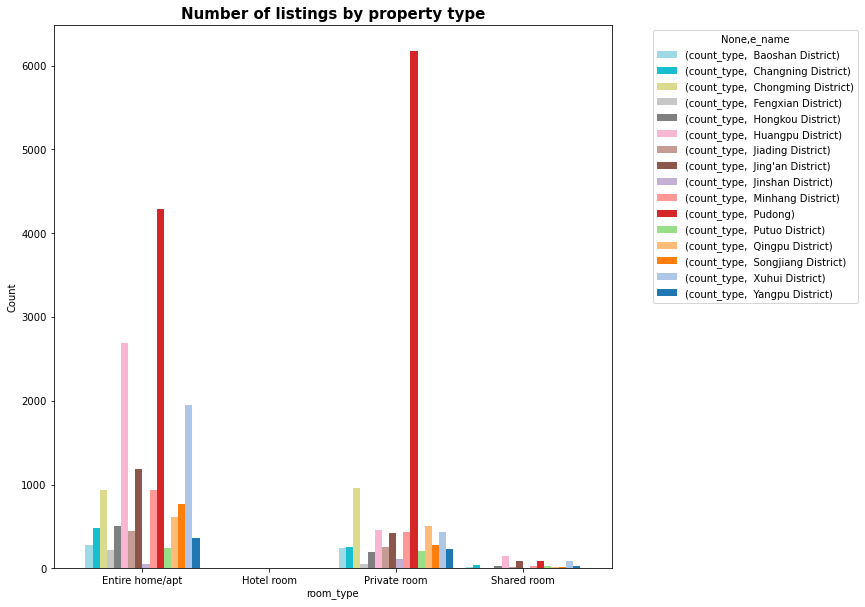

In [9]:
#plot to check what room_type appears most in London boroughs
ax2 = district_count21_rtype.unstack(level=0).plot(kind='bar',
                                                  subplots=False,
                                                  rot=0,
                                                  figsize=(10, 10),
                                                  legend = True,
                                                  width=0.9,
                                                  cmap='tab20_r')
                                                  #layout = (33,3))


leg2 = ax2.get_legend()
leg2.set_bbox_to_anchor((0., 0., 1.45, 1))
plt.ylabel('Count')
plt.title('Number of listings by property type', weight='bold', size=15) 
plt.show()

#### Calculate % of its property_type for each district 

In [10]:
district_count21_rtype_idx = district_count21_rtype.reset_index(level=['room_type'])

In [11]:
district_count21_sum = pd.DataFrame(a_2108_1.groupby(['e_name']).size())
district_count21_sum.rename(columns = {0:'count_sum'}, inplace = True)
district_count21_sum

,count_sum
e_name,
Baoshan District,533
Changning District,784
Chongming District,1895
Fengxian District,269
Hongkou District,727
Huangpu District,3298
Jiading District,713
Jing'an District,1697
Jinshan District,167


In [12]:
district_count21_sum =  district_count21_sum.merge(district_count21_rtype_idx, on='e_name', how ='left')
district_count21_sum

,count_sum,room_type,count_type
e_name,,,
Baoshan District,533,Entire home/apt,278
Baoshan District,533,Private room,241
Baoshan District,533,Shared room,14
Changning District,784,Entire home/apt,484
Changning District,784,Private room,258
Changning District,784,Shared room,42
Chongming District,1895,Entire home/apt,930
Chongming District,1895,Private room,959
Chongming District,1895,Shared room,6


In [13]:
#check room_type for each borough
district_count21_final = district_count21_sum.groupby(['e_name','room_type'])
district_count21_final = district_count21_final.first()
district_count21_final

count_sum  count_type
e_name              room_type                             
 Baoshan District   Entire home/apt        533         278
                    Private room           533         241
                    Shared room            533          14
 Changning District Entire home/apt        784         484
                    Private room           784         258
                    Shared room            784          42
 Chongming District Entire home/apt       1895         930
                    Private room          1895         959
                    Shared room           1895           6
 Fengxian District  Entire home/apt        269         222
                    Private room           269          47
 Hongkou District   Entire home/apt        727         504
                    Private room           727         193
                    Shared room            727          30
 Huangpu District   Entire home/apt       3298        2688
                    Private room          3298         461
                    Shared room           3298         149
 Jiading District   Entire home/apt        713         445
                    Private room           713         255
                    Shared room            713          13
 Jing'an District   Entire home/apt       1697        1186
                    Private room          1697         424
                    Shared room           1697          87
 Jinshan District   Entire home/apt        167          58
                    Private room           167         108
                    Shared room            167           1
 Minhang District   Entire home/apt       1396         936
                    Private room          1396         435
                    Shared room           1396          25
 Pudong             Entire home/apt      10555        4283
                    Hotel room           10555           2
                    Private room         10555        6177
                    Shared room          10555          93
 Putuo District     Entire home/apt        471         240
                    Private room           471         202
                    Shared room            471          29
 Qingpu District    Entire home/apt       1148         619
                    Private room          1148         507
                    Shared room           1148          22
 Songjiang District Entire home/apt       1066         767
                    Private room          1066         281
                    Shared room           1066          18
 Xuhui District     Entire home/apt       2470        1954
                    Private room          2470         432
                    Shared room           2470          84
 Yangpu District    Entire home/apt        616         365
                    Private room           616         227
                    Shared room            616          24

In [14]:
district_count21_final['per'] = (district_count21_final['count_type']/district_count21_final['count_sum'])*100
district_count21_final1 = district_count21_final.drop(['count_sum', 'count_type'],axis=1)

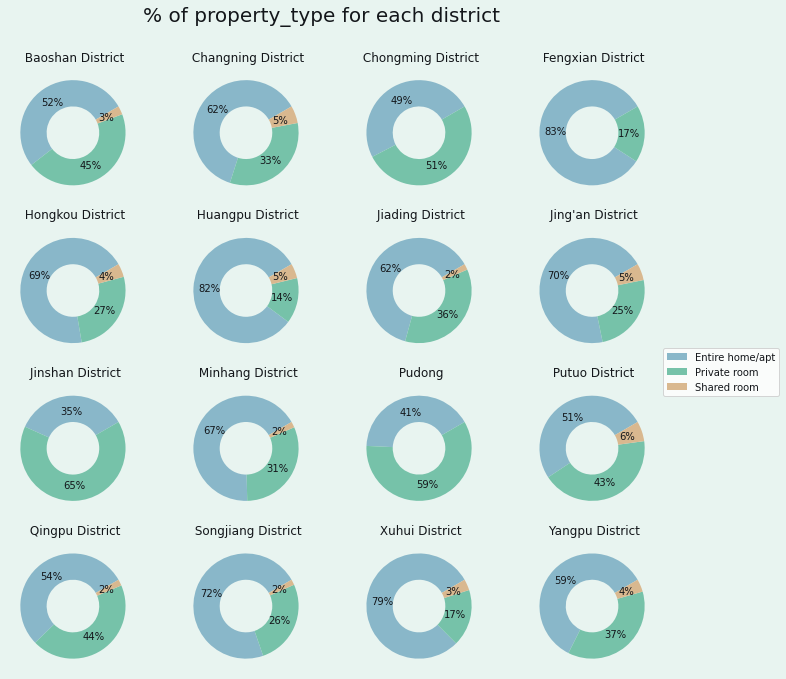

In [15]:
font_color = '#13161a'
colors = ['#89b7c9','#76c2a9','#d9b88f']

fig, axes = plt.subplots(4,4 , figsize=(12, 12), facecolor='#e8f4f0')
# help to remove one box
# fig.delaxes(ax= axes[3,3])

for i, (idx, row) in enumerate(district_count21_final1.unstack(level=1).head(16).iterrows()):
    ax = axes[i //4 , i % 4]
    row = row[row.gt(row.sum() * .01)]
    ax.pie(row,
           startangle=30, 
           wedgeprops=dict(width=0.5), # For donuts
           colors=colors,
           textprops={'color':font_color},
           autopct='%1.0f%%',pctdistance=0.7, labeldistance=1.5)
    ax.set_title(idx, fontsize=12, color='#13161a')
    
    legend = plt.legend([x[1] for x in row.index], 
                        bbox_to_anchor=(1, 2.5), # Legend position
                        loc='upper left',  
                        ncol=1, 
                        fancybox=True)
    for text in legend.get_texts():
        plt.setp(text, color=font_color) # Legend font color

fig.subplots_adjust(wspace=.15) # Space between charts
title = fig.suptitle('% of property_type for each district', y=0.92, fontsize=20, color='#13161a')
# To prevent the title from being cropped
plt.subplots_adjust(top=0.85, bottom=0.15)

In [16]:
a_2108_1

,id,host_id,room_type,review_scores_value,latitude,longitude,price,accommodates,bathrooms_text,bedrooms,beds,amenities,amenities_count,fullname,e_name
0,24963,98203,Entire home/apt,4.76,31.210730,121.451590,480.0,3,1 bath,1.0,2.0,"[""Smoke alarm"", ""Shampoo"", ""Paid parking off p...",32,徐汇区,Xuhui District
1,322045,681552,Entire home/apt,4.56,31.242400,121.444490,464.0,2,1 bath,1.0,1.0,"[""Smoke alarm"", ""Shampoo"", ""Paid parking off p...",24,静安区,Jing'an District
2,402315,681552,Entire home/apt,4.76,31.242870,121.443550,445.0,2,1 bath,1.0,1.0,"[""Smoke alarm"", ""Shampoo"", ""Paid parking off p...",27,静安区,Jing'an District
3,479499,681552,Entire home/apt,4.42,31.243660,121.443960,464.0,2,1 bath,1.0,1.0,"[""Smoke alarm"", ""Shampoo"", ""Paid parking off p...",22,静安区,Jing'an District
4,479506,681552,Entire home/apt,4.76,31.242110,121.442590,407.0,2,1 bath,1.0,1.0,"[""Smoke alarm"", ""Shampoo"", ""Paid parking off p...",24,静安区,Jing'an District
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27800,52504269,422241715,Entire home/apt,NaN,31.141783,121.327689,120.0,2,1 bath,NaN,1.0,"[""Dryer"", ""TV"", ""Elevator"", ""Fire extinguisher...",7,松江区,Songjiang District
27801,52505271,161080396,Private room,NaN,31.238201,121.446381,555.0,2,1 bath,1.0,2.0,"[""Dryer"", ""Smoke alarm"", ""Private entrance"", ""...",19,静安区,Jing'an District
27802,52505580,161080396,Entire home/apt,NaN,31.238201,121.446381,555.0,2,1 bath,1.0,2.0,"[""Private entrance"", ""Smoke alarm"", ""TV"", ""Ess...",15,静安区,Jing'an District
27803,52506106,161080396,Private room,NaN,31.263439,121.460289,555.0,2,1 bath,1.0,2.0,"[""Smoke alarm"", ""Shampoo"", ""Gym"", ""Breakfast"",...",21,静安区,Jing'an District


In [17]:
#  = a_2108_1.bathrooms_text.str.split(pat=" ",expand=True)
a_2108_1[['text','bathrooms']] = (a_2108_1['bathrooms_text'].str.extract(r'(?P<Name>.*?)(?P<Area>\d+(?:\.\d+)?)')
                 .applymap(str))
a_2108_1

,id,host_id,room_type,review_scores_value,latitude,longitude,price,accommodates,bathrooms_text,bedrooms,beds,amenities,amenities_count,fullname,e_name,text,bathrooms
0,24963,98203,Entire home/apt,4.76,31.210730,121.451590,480.0,3,1 bath,1.0,2.0,"[""Smoke alarm"", ""Shampoo"", ""Paid parking off p...",32,徐汇区,Xuhui District,,1
1,322045,681552,Entire home/apt,4.56,31.242400,121.444490,464.0,2,1 bath,1.0,1.0,"[""Smoke alarm"", ""Shampoo"", ""Paid parking off p...",24,静安区,Jing'an District,,1
2,402315,681552,Entire home/apt,4.76,31.242870,121.443550,445.0,2,1 bath,1.0,1.0,"[""Smoke alarm"", ""Shampoo"", ""Paid parking off p...",27,静安区,Jing'an District,,1
3,479499,681552,Entire home/apt,4.42,31.243660,121.443960,464.0,2,1 bath,1.0,1.0,"[""Smoke alarm"", ""Shampoo"", ""Paid parking off p...",22,静安区,Jing'an District,,1
4,479506,681552,Entire home/apt,4.76,31.242110,121.442590,407.0,2,1 bath,1.0,1.0,"[""Smoke alarm"", ""Shampoo"", ""Paid parking off p...",24,静安区,Jing'an District,,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27800,52504269,422241715,Entire home/apt,NaN,31.141783,121.327689,120.0,2,1 bath,NaN,1.0,"[""Dryer"", ""TV"", ""Elevator"", ""Fire extinguisher...",7,松江区,Songjiang District,,1
27801,52505271,161080396,Private room,NaN,31.238201,121.446381,555.0,2,1 bath,1.0,2.0,"[""Dryer"", ""Smoke alarm"", ""Private entrance"", ""...",19,静安区,Jing'an District,,1
27802,52505580,161080396,Entire home/apt,NaN,31.238201,121.446381,555.0,2,1 bath,1.0,2.0,"[""Private entrance"", ""Smoke alarm"", ""TV"", ""Ess...",15,静安区,Jing'an District,,1
27803,52506106,161080396,Private room,NaN,31.263439,121.460289,555.0,2,1 bath,1.0,2.0,"[""Smoke alarm"", ""Shampoo"", ""Gym"", ""Breakfast"",...",21,静安区,Jing'an District,,1


In [18]:
a_2108_1 = a_2108_1.drop(['text','bathrooms_text'],axis=1)
a_2108_1

,id,host_id,room_type,review_scores_value,latitude,longitude,price,accommodates,bedrooms,beds,amenities,amenities_count,fullname,e_name,bathrooms
0,24963,98203,Entire home/apt,4.76,31.210730,121.451590,480.0,3,1.0,2.0,"[""Smoke alarm"", ""Shampoo"", ""Paid parking off p...",32,徐汇区,Xuhui District,1
1,322045,681552,Entire home/apt,4.56,31.242400,121.444490,464.0,2,1.0,1.0,"[""Smoke alarm"", ""Shampoo"", ""Paid parking off p...",24,静安区,Jing'an District,1
2,402315,681552,Entire home/apt,4.76,31.242870,121.443550,445.0,2,1.0,1.0,"[""Smoke alarm"", ""Shampoo"", ""Paid parking off p...",27,静安区,Jing'an District,1
3,479499,681552,Entire home/apt,4.42,31.243660,121.443960,464.0,2,1.0,1.0,"[""Smoke alarm"", ""Shampoo"", ""Paid parking off p...",22,静安区,Jing'an District,1
4,479506,681552,Entire home/apt,4.76,31.242110,121.442590,407.0,2,1.0,1.0,"[""Smoke alarm"", ""Shampoo"", ""Paid parking off p...",24,静安区,Jing'an District,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27800,52504269,422241715,Entire home/apt,NaN,31.141783,121.327689,120.0,2,NaN,1.0,"[""Dryer"", ""TV"", ""Elevator"", ""Fire extinguisher...",7,松江区,Songjiang District,1
27801,52505271,161080396,Private room,NaN,31.238201,121.446381,555.0,2,1.0,2.0,"[""Dryer"", ""Smoke alarm"", ""Private entrance"", ""...",19,静安区,Jing'an District,1
27802,52505580,161080396,Entire home/apt,NaN,31.238201,121.446381,555.0,2,1.0,2.0,"[""Private entrance"", ""Smoke alarm"", ""TV"", ""Ess...",15,静安区,Jing'an District,1
27803,52506106,161080396,Private room,NaN,31.263439,121.460289,555.0,2,1.0,2.0,"[""Smoke alarm"", ""Shampoo"", ""Gym"", ""Breakfast"",...",21,静安区,Jing'an District,1


In [19]:
# fill in values to replace the nan value
a_2108_1['bathrooms'] = a_2108_1['bathrooms'].replace(['nan'],'0.5')

In [20]:
a_2108_1['bedrooms'] = a_2108_1['bedrooms'].fillna(0)
a_2108_1

,id,host_id,room_type,review_scores_value,latitude,longitude,price,accommodates,bedrooms,beds,amenities,amenities_count,fullname,e_name,bathrooms
0,24963,98203,Entire home/apt,4.76,31.210730,121.451590,480.0,3,1.0,2.0,"[""Smoke alarm"", ""Shampoo"", ""Paid parking off p...",32,徐汇区,Xuhui District,1
1,322045,681552,Entire home/apt,4.56,31.242400,121.444490,464.0,2,1.0,1.0,"[""Smoke alarm"", ""Shampoo"", ""Paid parking off p...",24,静安区,Jing'an District,1
2,402315,681552,Entire home/apt,4.76,31.242870,121.443550,445.0,2,1.0,1.0,"[""Smoke alarm"", ""Shampoo"", ""Paid parking off p...",27,静安区,Jing'an District,1
3,479499,681552,Entire home/apt,4.42,31.243660,121.443960,464.0,2,1.0,1.0,"[""Smoke alarm"", ""Shampoo"", ""Paid parking off p...",22,静安区,Jing'an District,1
4,479506,681552,Entire home/apt,4.76,31.242110,121.442590,407.0,2,1.0,1.0,"[""Smoke alarm"", ""Shampoo"", ""Paid parking off p...",24,静安区,Jing'an District,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27800,52504269,422241715,Entire home/apt,NaN,31.141783,121.327689,120.0,2,0.0,1.0,"[""Dryer"", ""TV"", ""Elevator"", ""Fire extinguisher...",7,松江区,Songjiang District,1
27801,52505271,161080396,Private room,NaN,31.238201,121.446381,555.0,2,1.0,2.0,"[""Dryer"", ""Smoke alarm"", ""Private entrance"", ""...",19,静安区,Jing'an District,1
27802,52505580,161080396,Entire home/apt,NaN,31.238201,121.446381,555.0,2,1.0,2.0,"[""Private entrance"", ""Smoke alarm"", ""TV"", ""Ess...",15,静安区,Jing'an District,1
27803,52506106,161080396,Private room,NaN,31.263439,121.460289,555.0,2,1.0,2.0,"[""Smoke alarm"", ""Shampoo"", ""Gym"", ""Breakfast"",...",21,静安区,Jing'an District,1


### to calculate the attaction number within 5km listings - using the qgis 5km boxes

In [21]:
# readin boxes:
sssh_grid = gpd.read_file('final_sh_grid/sh_grid.geojson')
sssh_grid.crs

<Projected CRS: EPSG:32645>
Name: WGS 84 / UTM zone 45N
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: Between 84°E and 90°E, northern hemisphere between equator and 84°N, onshore and offshore. Bangladesh. Bhutan. China. India. Kazakhstan. Mongolia. Nepal. Russian Federation.
- bounds: (84.0, 0.0, 90.0, 84.0)
Coordinate Operation:
- name: UTM zone 45N
- method: Transverse Mercator
Datum: World Geodetic System 1984
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [22]:
sssh_grid = sssh_grid.to_crs("epsg:4326")

In [23]:
# transform data
ga21 = gpd.GeoDataFrame(a_2108_1, geometry=gpd.points_from_xy(a_2108_1.longitude, a_2108_1.latitude, crs='epsg:4326'))
ga21 = ga21.to_crs('epsg:4326')

In [24]:
# join the airbnb points with grid map
merged_sssh_g = geopandas.sjoin(sssh_grid, ga21, how='left', op='contains')
merged_sssh_g

,id_left,left,top,right,bottom,geometry,index_right,id_right,host_id,room_type,...,longitude,price,accommodates,bedrooms,beds,amenities,amenities_count,fullname,e_name,bathrooms
0,333,3.867506e+06,4.029805e+06,3.872506e+06,4.024805e+06,"MULTIPOLYGON (((121.45875 31.28167, 121.50202 ...",7517.0,35955742.0,75151322.0,Entire home/apt,...,121.48572,602.0,2.0,1.0,1.0,"[""Heating"", ""Smoke alarm"", ""TV"", ""Essentials"",...",16.0,黄浦区,Huangpu District,1
0,333,3.867506e+06,4.029805e+06,3.872506e+06,4.024805e+06,"MULTIPOLYGON (((121.45875 31.28167, 121.50202 ...",16207.0,44388275.0,347607032.0,Entire home/apt,...,121.48571,718.0,2.0,1.0,1.0,"[""TV"", ""Essentials"", ""Shampoo"", ""Air condition...",6.0,黄浦区,Huangpu District,1
0,333,3.867506e+06,4.029805e+06,3.872506e+06,4.024805e+06,"MULTIPOLYGON (((121.45875 31.28167, 121.50202 ...",13377.0,41725834.0,328619389.0,Private room,...,121.48563,915.0,4.0,1.0,2.0,"[""Smoke alarm"", ""Shampoo"", ""Keypad"", ""Long ter...",24.0,黄浦区,Huangpu District,1
0,333,3.867506e+06,4.029805e+06,3.872506e+06,4.024805e+06,"MULTIPOLYGON (((121.45875 31.28167, 121.50202 ...",4698.0,31197932.0,71243063.0,Entire home/apt,...,121.48549,1092.0,4.0,2.0,2.0,"[""Shower gel"", ""Smoke alarm"", ""Private entranc...",18.0,黄浦区,Huangpu District,1
0,333,3.867506e+06,4.029805e+06,3.872506e+06,4.024805e+06,"MULTIPOLYGON (((121.45875 31.28167, 121.50202 ...",13376.0,41725620.0,328619389.0,Private room,...,121.48568,490.0,4.0,1.0,2.0,"[""Smoke alarm"", ""Shampoo"", ""Long term stays al...",20.0,黄浦区,Huangpu District,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
524,675,3.927506e+06,4.059805e+06,3.932506e+06,4.054805e+06,"MULTIPOLYGON (((122.07801 31.32353, 122.10936 ...",NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
525,676,3.927506e+06,4.054805e+06,3.932506e+06,4.049805e+06,"MULTIPOLYGON (((122.07201 31.26683, 122.04101 ...",NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
526,704,3.932506e+06,4.059805e+06,3.937506e+06,4.054805e+06,"MULTIPOLYGON (((122.11668 31.32123, 122.12198 ...",NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
527,705,3.932506e+06,4.054805e+06,3.937506e+06,4.049805e+06,"MULTIPOLYGON (((122.10521 31.26214, 122.09777 ...",NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [25]:
airbnb_5kmbox = merged_sssh_g.drop(['left','top','right','bottom','geometry'],axis=1)
airbnb_5kmbox.head()

,id_left,index_right,id_right,host_id,room_type,review_scores_value,latitude,longitude,price,accommodates,bedrooms,beds,amenities,amenities_count,fullname,e_name,bathrooms
0,333,7517.0,35955742.0,75151322.0,Entire home/apt,3.71,31.23155,121.48572,602.0,2.0,1.0,1.0,"[""Heating"", ""Smoke alarm"", ""TV"", ""Essentials"",...",16.0,黄浦区,Huangpu District,1
0,333,16207.0,44388275.0,347607032.0,Entire home/apt,4.50,31.23161,121.48571,718.0,2.0,1.0,1.0,"[""TV"", ""Essentials"", ""Shampoo"", ""Air condition...",6.0,黄浦区,Huangpu District,1
0,333,13377.0,41725834.0,328619389.0,Private room,3.75,31.23163,121.48563,915.0,4.0,1.0,2.0,"[""Smoke alarm"", ""Shampoo"", ""Keypad"", ""Long ter...",24.0,黄浦区,Huangpu District,1
0,333,4698.0,31197932.0,71243063.0,Entire home/apt,4.54,31.23171,121.48549,1092.0,4.0,2.0,2.0,"[""Shower gel"", ""Smoke alarm"", ""Private entranc...",18.0,黄浦区,Huangpu District,1
0,333,13376.0,41725620.0,328619389.0,Private room,4.00,31.23171,121.48568,490.0,4.0,1.0,2.0,"[""Smoke alarm"", ""Shampoo"", ""Long term stays al...",20.0,黄浦区,Huangpu District,1


## Join the independent variable to the dataset (x).

In [26]:
# read POI data
bus = pd.read_csv('./data/final poi/bus_poi.csv')
tube= pd.read_csv('./data/final poi/tube.csv')
mall = pd.read_csv('./data/final poi/mall.csv')
train = pd.read_csv('./data/final poi/train.csv')
airport = pd.read_csv('./data/final poi/airport.csv')
park = pd.read_csv('./data/final poi/park.csv')
restaurant = pd.read_csv('./data/final poi/restaurant.csv')
att = pd.read_csv('./data/final poi/att.csv')
school = pd.read_csv('./data/final poi/school.csv')
hotel = pd.read_csv('./data/final poi/hotel.csv')


In [27]:
#read distance
bus_dis = pd.read_csv('./data/distance/bus_dis.csv')
tube_dis = pd.read_csv('./data/distance/tube_dis.csv')
train_dis = pd.read_csv('./data/distance/train_dis.csv')
mall_dis = pd.read_csv('./data/distance/mall_dis.csv')
rest_dis = pd.read_csv('./data/distance/rest_dis.csv')
att_dis = pd.read_csv('./data/distance/att_dis.csv')
park_dis = pd.read_csv('./data/distance/park_dis.csv')
#hotel and school -> count how many near them

In [28]:
airport_dis = pd.read_csv('./data/distance/airpot_dis.csv')

In [29]:
# rental_clean = pd.read_csv('./rental_clean.csv')

In [30]:
# rental_clean = rental_clean.drop('ave_rental_price', axis=1)
# rental_clean["log_rental_price"] = np.log(rental_clean["ave_rental_price_per_night"] + 0.000001)
# rental_clean = rental_clean.drop('ave_rental_price_per_night', axis=1)
# rental_clean['log_rental_price'] = rental_clean['log_rental_price'].fillna(0)
# rental_clean

In [31]:
# ave_rental_5km = airbnb_5kmbox.merge(rental_clean, on='id_left', how ='left')
# ave_rental_5km

### attraction counts

In [32]:
att.rename(columns = {'wgs84_lng':'lng', 'wgs84_lat':'lat'}, inplace = True)

In [33]:
# change df to geodataframe
att_g = gpd.GeoDataFrame(att, geometry=gpd.points_from_xy(att.lng, att.lat, crs='epsg:4326'))
att_g = att_g.to_crs('epsg:4326')
att_g.head()

,id,name,type,typeCode,bizType,address,gcj02_lng,gcj02_lat,lng,lat,tel,provinceName,cityName,adName,geometry
0,B0FFFEEH8F,广良寺,风景名胜;风景名胜;寺庙道观,110205,tour,北沿公路1331,121.836319,31.540976,121.832074,31.543009,021-59402329,上海市,上海市,崇明区,POINT (121.83207 31.54301)
1,B0FFGYR6SW,清净庵,风景名胜;风景名胜;寺庙道观,110205,tour,裕安镇德云村253号,121.835005,31.543539,121.830756,31.545570,021-59402229,上海市,上海市,崇明区,POINT (121.83076 31.54557)
2,B00156CLWX,东滩湿地公园,风景名胜;公园广场;公园,110101,tour,东旺路,121.951233,31.516967,121.947059,31.519023,021-39367000;021-39367042,上海市,上海市,崇明区,POINT (121.94706 31.51902)
3,B0GR3LK1FA,陈家镇社区文化活动中心室外公共广场,风景名胜;公园广场;城市广场,110105,tour,陈家镇裕国路388号,121.842458,31.522137,121.838230,31.524184,[],上海市,上海市,崇明区,POINT (121.83823 31.52418)
4,B0GK9HOUD8,清净庵香烛供应处,风景名胜;风景名胜;寺庙道观,110205,tour,北沿公路与老庙路交叉口西北200米,121.834952,31.543167,121.830703,31.545198,[],上海市,上海市,崇明区,POINT (121.83070 31.54520)


In [34]:
# join the tube points with grid map
att_grid = geopandas.sjoin(sssh_grid, att_g,  how='left', op='contains')
att_grid_count = pd.DataFrame(att_grid.groupby(['id_left'])['id_right'].count())
att_grid_count.rename(columns = {'id_right':'att_counts'}, inplace = True)
att_grid_count

,att_counts
id_left,
2,0
3,0
4,0
5,0
21,0
...,...
743,0
744,0
745,0


In [35]:
att_count_5km = airbnb_5kmbox.merge(att_grid_count, on='id_left', how ='left')
att_count_5km.rename(columns = {'id_right':'id'}, inplace = True)
att_count_5km

,id_left,index_right,id,host_id,room_type,review_scores_value,latitude,longitude,price,accommodates,bedrooms,beds,amenities,amenities_count,fullname,e_name,bathrooms,att_counts
0,333,7517.0,35955742.0,75151322.0,Entire home/apt,3.71,31.23155,121.48572,602.0,2.0,1.0,1.0,"[""Heating"", ""Smoke alarm"", ""TV"", ""Essentials"",...",16.0,黄浦区,Huangpu District,1,170
1,333,16207.0,44388275.0,347607032.0,Entire home/apt,4.50,31.23161,121.48571,718.0,2.0,1.0,1.0,"[""TV"", ""Essentials"", ""Shampoo"", ""Air condition...",6.0,黄浦区,Huangpu District,1,170
2,333,13377.0,41725834.0,328619389.0,Private room,3.75,31.23163,121.48563,915.0,4.0,1.0,2.0,"[""Smoke alarm"", ""Shampoo"", ""Keypad"", ""Long ter...",24.0,黄浦区,Huangpu District,1,170
3,333,4698.0,31197932.0,71243063.0,Entire home/apt,4.54,31.23171,121.48549,1092.0,4.0,2.0,2.0,"[""Shower gel"", ""Smoke alarm"", ""Private entranc...",18.0,黄浦区,Huangpu District,1,170
4,333,13376.0,41725620.0,328619389.0,Private room,4.00,31.23171,121.48568,490.0,4.0,1.0,2.0,"[""Smoke alarm"", ""Shampoo"", ""Long term stays al...",20.0,黄浦区,Huangpu District,1,170
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27976,675,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
27977,676,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
27978,704,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
27979,705,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0


### Hotel counts

In [36]:
hotel.rename(columns = {'wgs84_lng':'lng', 'wgs84_lat':'lat'}, inplace = True)
hotel['adName'] = hotel['adName'].str.strip()

hotel_g = gpd.GeoDataFrame(hotel, geometry=gpd.points_from_xy(hotel.lng, hotel.lat, crs='epsg:4326'))
hotel_g = hotel_g.to_crs('epsg:4326')
hotel_g

,id,name,type,typeCode,bizType,address,gcj02_lng,gcj02_lat,lng,lat,provinceName,cityName,adName,geometry
0,B00155QV5K,庭冠宾馆,住宿服务;宾馆酒店;宾馆酒店,100100,hotel,行南路349弄100号,121.587464,31.325758,121.583250,31.327919,上海市,上海市,浦东新区,POINT (121.58325 31.32792)
1,B0FFI9OKB0,锦江之星风尚(上海浦东金融学院曹路镇政府店),住宿服务;宾馆酒店;经济型连锁酒店,100105,hotel,曹路镇川沙路420号,121.668118,31.276792,121.663831,31.278889,上海市,上海市,浦东新区,POINT (121.66383 31.27889)
2,B00156TK5S,99旅馆连锁(上海浦东金桥金高路店),住宿服务;宾馆酒店;经济型连锁酒店,100105,hotel,金高路1310号4层,121.609746,31.277357,121.605540,31.279536,上海市,上海市,浦东新区,POINT (121.60554 31.27954)
3,B00156OB1O,上海圣园旅馆,住宿服务;旅馆招待所;旅馆招待所|住宿服务;宾馆酒店;宾馆酒店,100200|100100,hotel,长兴镇先进村419号,121.693015,31.391262,121.688672,31.393272,上海市,上海市,崇明区,POINT (121.68867 31.39327)
4,B00156GMNT,易佰良品酒店(上海金桥金高路店),住宿服务;宾馆酒店;经济型连锁酒店,100105,hotel,金高路1310号3层,121.609588,31.277223,121.605382,31.279402,上海市,上海市,浦东新区,POINT (121.60538 31.27940)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4437,B0GDLMGMGU,如家商旅酒店(上海八佰伴金融中心店),住宿服务;宾馆酒店;宾馆酒店,100100,hotel,张杨路579号5-6层(商城路地铁站2号口步行330米),121.518349,31.228336,121.513983,31.230410,上海市,上海市,浦东新区,POINT (121.51398 31.23041)
4438,B0HAMU2VYR,上海陆家嘴八佰伴兰欧酒店,住宿服务;宾馆酒店;宾馆酒店,100100,hotel,浦东南路1271号华融大厦1层,121.517033,31.226400,121.512663,31.228471,上海市,上海市,浦东新区,POINT (121.51266 31.22847)
4439,B0IGNZ0A6A,富源酒店公寓(上海塘桥地铁站店),住宿服务;宾馆酒店;宾馆酒店,100100,hotel,南泉路1287号(塘桥地铁站1号口步行490米),121.522417,31.210738,121.518067,31.212832,上海市,上海市,浦东新区,POINT (121.51807 31.21283)
4440,B0FFM1LEP0,一间森林酒店(上海东方明珠店),住宿服务;宾馆酒店;宾馆酒店,100100,hotel,张扬路88号二楼一间森林S酒店,121.510087,31.224392,121.505693,31.226444,上海市,上海市,浦东新区,POINT (121.50569 31.22644)


In [37]:
hotel_grid = geopandas.sjoin(sssh_grid, hotel_g, how='left',op='contains')
hotel_grid_count = pd.DataFrame(hotel_grid.groupby(['id_left'])['id_right'].count())
hotel_grid_count.rename(columns = {'id_right':'hotel_counts'}, inplace = True)
hotel_grid_count

,hotel_counts
id_left,
2,0
3,0
4,0
5,0
21,0
...,...
743,0
744,0
745,0


In [38]:
hotel_count_5km = att_count_5km.merge(hotel_grid_count, on='id_left', how ='left')
hotel_count_5km

,id_left,index_right,id,host_id,room_type,review_scores_value,latitude,longitude,price,accommodates,bedrooms,beds,amenities,amenities_count,fullname,e_name,bathrooms,att_counts,hotel_counts
0,333,7517.0,35955742.0,75151322.0,Entire home/apt,3.71,31.23155,121.48572,602.0,2.0,1.0,1.0,"[""Heating"", ""Smoke alarm"", ""TV"", ""Essentials"",...",16.0,黄浦区,Huangpu District,1,170,305
1,333,16207.0,44388275.0,347607032.0,Entire home/apt,4.50,31.23161,121.48571,718.0,2.0,1.0,1.0,"[""TV"", ""Essentials"", ""Shampoo"", ""Air condition...",6.0,黄浦区,Huangpu District,1,170,305
2,333,13377.0,41725834.0,328619389.0,Private room,3.75,31.23163,121.48563,915.0,4.0,1.0,2.0,"[""Smoke alarm"", ""Shampoo"", ""Keypad"", ""Long ter...",24.0,黄浦区,Huangpu District,1,170,305
3,333,4698.0,31197932.0,71243063.0,Entire home/apt,4.54,31.23171,121.48549,1092.0,4.0,2.0,2.0,"[""Shower gel"", ""Smoke alarm"", ""Private entranc...",18.0,黄浦区,Huangpu District,1,170,305
4,333,13376.0,41725620.0,328619389.0,Private room,4.00,31.23171,121.48568,490.0,4.0,1.0,2.0,"[""Smoke alarm"", ""Shampoo"", ""Long term stays al...",20.0,黄浦区,Huangpu District,1,170,305
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27976,675,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0
27977,676,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0
27978,704,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0
27979,705,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0


### Mall Countes

In [39]:
mall.rename(columns = {'wgs84_lon':'lng', 'wgs84_lat':'lat'}, inplace = True)
mall['adname'] = mall['adname'].str.strip()

# change df to geodataframe
mall_g = gpd.GeoDataFrame(mall, geometry=gpd.points_from_xy(mall.lng, mall.lat, crs='epsg:4326'))
mall_g = mall_g.to_crs('epsg:4326')
mall_g

,id,name,type,typecode,address,tel,pname,cityname,adname,gcj02_lon,gcj02_lat,lng,lat,geometry
0,B0FFH0GTMX,崇明县良舟超市,购物服务;超级市场;超市,060400,东旺西路94号,021-59471128,上海市,上海市,崇明区,121.912336,31.519255,121.908206,31.521363,POINT (121.90821 31.52136)
1,B0FFHRFYEV,MARUMAN|MAJESTY GOLF(雅居乐米克尔森专卖店),购物服务;专卖店;专营店,061200,东大公路5333号俱乐部会所专卖店内,021-38001917,上海市,上海市,浦东新区,121.902876,30.988697,121.898789,30.991026,POINT (121.89879 30.99103)
2,B00154D78A,华联超市(东南店),购物服务;超级市场;超市,060400,三三公路5037号,021-58292161,上海市,上海市,浦东新区,121.904749,30.954180,121.900665,30.956530,POINT (121.90067 30.95653)
3,B0G33CZ8TP,百联临港生活中心,购物服务;商场;购物中心,060101,宜浩佳园北侧,021-68286232,上海市,上海市,浦东新区,121.911141,30.901058,121.907062,30.903437,POINT (121.90706 30.90344)
4,B0FFG8LUXK,山兰路步行街,购物服务;特色商业街;步行街,061001,瑞木路刚泰国际大厦,[],上海市,上海市,浦东新区,121.924416,30.897847,121.920332,30.900219,POINT (121.92033 30.90022)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
112532,B0G26BKMO4,AJ专柜(第一百货商业中心店),购物服务;购物相关场所;购物相关场所,060000,南京东路800号第一百货商业中心F2,[],上海市,上海市,黄浦区,121.474661,31.235497,121.470141,31.237440,POINT (121.47014 31.23744)
112533,B0G16GY7NZ,欧莱雅(上海市第一百货商店南京东路店),购物服务;个人用品/化妆品店;其它个人用品店,061400,南京东路800-830号上海市第一百货商店F1层,4008215098;95085123,上海市,上海市,黄浦区,121.475278,31.235521,121.470760,31.237465,POINT (121.47076 31.23747)
112534,B0FFMCCD6L,浪肯(上海市第一百货商店),购物服务;服装鞋帽皮具店;品牌服装店,061101,南京西路268号4楼(人民广场地铁站19号口步行220米),[],上海市,上海市,黄浦区,121.475267,31.235567,121.470749,31.237511,POINT (121.47075 31.23751)
112535,B0FFL7ETNW,Koradior eIsewhere(第一百货商业中心店),购物服务;服装鞋帽皮具店;品牌服装店,061101,南京东路800号第一百货商业中心F2,021-62266691,上海市,上海市,黄浦区,121.474789,31.235087,121.470269,31.237030,POINT (121.47027 31.23703)


In [40]:
# join the tube points with grid map
mall_grid = geopandas.sjoin(sssh_grid, mall_g,  how='left', op='contains')
mall_grid_count = pd.DataFrame(mall_grid.groupby(['id_left'])['id_right'].count())
mall_grid_count.rename(columns = {'id_right':'mall_counts'}, inplace = True)
mall_grid_count

,mall_counts
id_left,
2,0
3,0
4,0
5,0
21,2
...,...
743,0
744,0
745,0


In [41]:
# merge airbnb hotel bus tube and mall.
mall_count_5km = hotel_count_5km.merge(mall_grid_count, on='id_left', how ='left')
mall_count_5km

,id_left,index_right,id,host_id,room_type,review_scores_value,latitude,longitude,price,accommodates,bedrooms,beds,amenities,amenities_count,fullname,e_name,bathrooms,att_counts,hotel_counts,mall_counts
0,333,7517.0,35955742.0,75151322.0,Entire home/apt,3.71,31.23155,121.48572,602.0,2.0,1.0,1.0,"[""Heating"", ""Smoke alarm"", ""TV"", ""Essentials"",...",16.0,黄浦区,Huangpu District,1,170,305,4891
1,333,16207.0,44388275.0,347607032.0,Entire home/apt,4.50,31.23161,121.48571,718.0,2.0,1.0,1.0,"[""TV"", ""Essentials"", ""Shampoo"", ""Air condition...",6.0,黄浦区,Huangpu District,1,170,305,4891
2,333,13377.0,41725834.0,328619389.0,Private room,3.75,31.23163,121.48563,915.0,4.0,1.0,2.0,"[""Smoke alarm"", ""Shampoo"", ""Keypad"", ""Long ter...",24.0,黄浦区,Huangpu District,1,170,305,4891
3,333,4698.0,31197932.0,71243063.0,Entire home/apt,4.54,31.23171,121.48549,1092.0,4.0,2.0,2.0,"[""Shower gel"", ""Smoke alarm"", ""Private entranc...",18.0,黄浦区,Huangpu District,1,170,305,4891
4,333,13376.0,41725620.0,328619389.0,Private room,4.00,31.23171,121.48568,490.0,4.0,1.0,2.0,"[""Smoke alarm"", ""Shampoo"", ""Long term stays al...",20.0,黄浦区,Huangpu District,1,170,305,4891
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27976,675,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0
27977,676,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0
27978,704,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0
27979,705,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0


### Metro station Counts

In [42]:
tube.rename(columns = {'wgs84_lon':'lng', 'wgs84_lat':'lat'}, inplace = True)

# to clean the tube data
tube[['staion','number']] = tube.name.str.split(pat="地铁站",expand=True)

#drop duplicate tube station
tube1 = tube.drop_duplicates('staion')
tube1['adname'] = tube1['adname'].str.strip()

# change df to geodataframe
tube_g = gpd.GeoDataFrame(tube1, geometry=gpd.points_from_xy(tube1.lng, tube1.lat, crs='epsg:4326'))
tube_g = tube_g.to_crs('epsg:4326')
tube_g


/opt/conda/envs/sds2021/lib/python3.9/site-packages/pandas/core/frame.py:3607: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._set_item(key, value)


,id,name,type,typecode,address,tel,pname,cityname,adname,gcj02_lon,gcj02_lat,lng,lat,staion,number,geometry
0,BV10027135,书院(地铁站),交通设施服务;地铁站;地铁站,150500,16号线,[],上海市,上海市,浦东新区,121.850520,30.959264,121.846358,30.961562,书院(,),POINT (121.84636 30.96156)
1,BV10039813,临港大道(地铁站),交通设施服务;地铁站;地铁站,150500,16号线,[],上海市,上海市,浦东新区,121.910851,30.923519,121.906770,30.925885,临港大道(,),POINT (121.90677 30.92589)
2,BV10035241,滴水湖(地铁站),交通设施服务;地铁站;地铁站,150500,16号线,[],上海市,上海市,浦东新区,121.929583,30.907245,121.925493,30.909605,滴水湖(,),POINT (121.92549 30.90961)
3,BV10039814,惠南东(地铁站),交通设施服务;地铁站;地铁站,150500,16号线,[],上海市,上海市,浦东新区,121.793800,31.026448,121.789495,31.028606,惠南东(,),POINT (121.78949 31.02861)
4,BV10039815,惠南(地铁站),交通设施服务;地铁站;地铁站,150500,16号线,[],上海市,上海市,浦东新区,121.761677,31.053828,121.757322,31.055939,惠南(,),POINT (121.75732 31.05594)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1071,BX10016773,龙溪路地铁站2号口,交通设施服务;地铁站;出入口,150501,10号线,[],上海市,上海市,长宁区,121.380981,31.194665,121.376344,31.196527,龙溪路,2号口,POINT (121.37634 31.19653)
1080,BX10020178,桂林公园地铁站1号口,交通设施服务;地铁站;出入口,150501,12号线,[],上海市,上海市,徐汇区,121.420485,31.167354,121.415848,31.169227,桂林公园,1号口,POINT (121.41585 31.16923)
1089,BX10016853,东安路地铁站2号口,交通设施服务;地铁站;出入口,150501,4号线,[],上海市,上海市,徐汇区,121.454066,31.190321,121.449488,31.192234,东安路,2号口,POINT (121.44949 31.19223)
1092,BX10016744,伊犁路地铁站1号口,交通设施服务;地铁站;出入口,150501,10号线,[],上海市,上海市,长宁区,121.404224,31.199207,121.399575,31.201057,伊犁路,1号口,POINT (121.39958 31.20106)


In [43]:
# join the tube points with grid map
tube_grid = geopandas.sjoin(sssh_grid, tube_g,  how='left', op='contains')
tube_grid_count = pd.DataFrame(tube_grid.groupby(['id_left'])['id_right'].count())
tube_grid_count.rename(columns = {'id_right':'tube_counts'}, inplace = True)
tube_grid_count

,tube_counts
id_left,
2,0
3,0
4,0
5,0
21,0
...,...
743,0
744,0
745,0


In [44]:
# merge airbnb hotel bus and tube
tube_count_5km = mall_count_5km.merge(tube_grid_count, on='id_left', how ='left')
tube_count_5km
#count_hab_g.to_csv("try1.csv")

,id_left,index_right,id,host_id,room_type,review_scores_value,latitude,longitude,price,accommodates,...,beds,amenities,amenities_count,fullname,e_name,bathrooms,att_counts,hotel_counts,mall_counts,tube_counts
0,333,7517.0,35955742.0,75151322.0,Entire home/apt,3.71,31.23155,121.48572,602.0,2.0,...,1.0,"[""Heating"", ""Smoke alarm"", ""TV"", ""Essentials"",...",16.0,黄浦区,Huangpu District,1,170,305,4891,27
1,333,16207.0,44388275.0,347607032.0,Entire home/apt,4.50,31.23161,121.48571,718.0,2.0,...,1.0,"[""TV"", ""Essentials"", ""Shampoo"", ""Air condition...",6.0,黄浦区,Huangpu District,1,170,305,4891,27
2,333,13377.0,41725834.0,328619389.0,Private room,3.75,31.23163,121.48563,915.0,4.0,...,2.0,"[""Smoke alarm"", ""Shampoo"", ""Keypad"", ""Long ter...",24.0,黄浦区,Huangpu District,1,170,305,4891,27
3,333,4698.0,31197932.0,71243063.0,Entire home/apt,4.54,31.23171,121.48549,1092.0,4.0,...,2.0,"[""Shower gel"", ""Smoke alarm"", ""Private entranc...",18.0,黄浦区,Huangpu District,1,170,305,4891,27
4,333,13376.0,41725620.0,328619389.0,Private room,4.00,31.23171,121.48568,490.0,4.0,...,2.0,"[""Smoke alarm"", ""Shampoo"", ""Long term stays al...",20.0,黄浦区,Huangpu District,1,170,305,4891,27
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27976,675,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0
27977,676,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0
27978,704,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0
27979,705,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0


### Bus Station Counts

In [45]:
bus.rename(columns = {'wgs84_lng':'lng', 'wgs84_lat':'lat'}, inplace = True)
bus['adName'] = bus['adName'].str.strip()
bus_g = gpd.GeoDataFrame(bus, geometry=gpd.points_from_xy(bus.lng, bus.lat, crs='epsg:4326'))
bus_g = bus_g.to_crs('epsg:4326')
bus_g

,id,name,type,typeCode,bizType,address,gcj02_lng,gcj02_lat,lng,lat,tel,provinceName,cityName,adName,geometry
0,BV10501824,南汇嘴观海公园(公交站),交通设施服务;公交车站;公交车站相关,150700,[],浦东33路,121.971771,30.882118,121.967599,30.884406,[],上海市,上海市,浦东新区,POINT (121.96760 30.88441)
1,BV11648836,环湖南二路(公交站),交通设施服务;公交车站;公交车站相关,150700,[],环滴水湖观光线,121.949032,30.882873,121.944915,30.885215,[],上海市,上海市,浦东新区,POINT (121.94491 30.88522)
2,BV10501826,小桉路环湖东一路(公交站),交通设施服务;公交车站;公交车站相关,150700,[],浦东33路,121.954781,30.892435,121.950651,30.894760,[],上海市,上海市,浦东新区,POINT (121.95065 30.89476)
3,BV10501828,环湖东一路小桉路(公交站),交通设施服务;公交车站;公交车站相关,150700,[],浦东33路;环滴水湖观光线,121.952057,30.890152,121.947933,30.892484,[],上海市,上海市,浦东新区,POINT (121.94793 30.89248)
4,BV11694067,临港科技城(公交站),交通设施服务;公交车站;公交车站相关,150700,[],临港定制2线,121.917513,30.877548,121.913434,30.879937,[],上海市,上海市,浦东新区,POINT (121.91343 30.87994)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7899,BV11576035,海门路东长治路(公交站),交通设施服务;公交车站;公交车站相关,150700,[],13路,121.507808,31.254388,121.503403,31.256419,[],上海市,上海市,虹口区,POINT (121.50340 31.25642)
7900,BV10024880,杨树浦路大连路(公交站),交通设施服务;公交车站;公交车站相关,150700,[],135路;28路;853路,121.519093,31.252005,121.514728,31.254071,[],上海市,上海市,杨浦区,POINT (121.51473 31.25407)
7901,BV11305605,汉口路四川中路(公交站),交通设施服务;公交车站;公交车站相关,150700,[],20路;20路(22:30后),121.487770,31.236441,121.483294,31.238421,[],上海市,上海市,黄浦区,POINT (121.48329 31.23842)
7902,BV10029902,潍坊路东方路(公交站),交通设施服务;公交车站;公交车站相关,150700,[],1019路(环线);130路;792路;798路;987路;隧道三线,121.525977,31.225694,121.521638,31.227791,[],上海市,上海市,浦东新区,POINT (121.52164 31.22779)


In [46]:
# join the airbnb points with grid map
# 如果用left join就会把nan也保留下来，所有没有点的box也会直接被算为1。
# 如果不用left 就直接会把那个box给删掉
# hotel_grid = geopandas.sjoin(sssh_grid, hotel_g, how='left', op='contains')
bus_grid = geopandas.sjoin(sssh_grid, bus_g,  how='left', op='contains')
bus_grid_count = pd.DataFrame(bus_grid.groupby(['id_left'])['id_right'].count())
bus_grid_count.rename(columns = {'id_right':'bus_counts'}, inplace = True)
bus_grid_count

,bus_counts
id_left,
2,0
3,0
4,1
5,0
21,0
...,...
743,0
744,0
745,0


In [47]:
bus_count_5km = tube_count_5km.merge(bus_grid_count, on='id_left', how ='left')
bus_count_5km

,id_left,index_right,id,host_id,room_type,review_scores_value,latitude,longitude,price,accommodates,...,amenities,amenities_count,fullname,e_name,bathrooms,att_counts,hotel_counts,mall_counts,tube_counts,bus_counts
0,333,7517.0,35955742.0,75151322.0,Entire home/apt,3.71,31.23155,121.48572,602.0,2.0,...,"[""Heating"", ""Smoke alarm"", ""TV"", ""Essentials"",...",16.0,黄浦区,Huangpu District,1,170,305,4891,27,39
1,333,16207.0,44388275.0,347607032.0,Entire home/apt,4.50,31.23161,121.48571,718.0,2.0,...,"[""TV"", ""Essentials"", ""Shampoo"", ""Air condition...",6.0,黄浦区,Huangpu District,1,170,305,4891,27,39
2,333,13377.0,41725834.0,328619389.0,Private room,3.75,31.23163,121.48563,915.0,4.0,...,"[""Smoke alarm"", ""Shampoo"", ""Keypad"", ""Long ter...",24.0,黄浦区,Huangpu District,1,170,305,4891,27,39
3,333,4698.0,31197932.0,71243063.0,Entire home/apt,4.54,31.23171,121.48549,1092.0,4.0,...,"[""Shower gel"", ""Smoke alarm"", ""Private entranc...",18.0,黄浦区,Huangpu District,1,170,305,4891,27,39
4,333,13376.0,41725620.0,328619389.0,Private room,4.00,31.23171,121.48568,490.0,4.0,...,"[""Smoke alarm"", ""Shampoo"", ""Long term stays al...",20.0,黄浦区,Huangpu District,1,170,305,4891,27,39
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27976,675,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0
27977,676,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0
27978,704,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0
27979,705,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0


### Airport Counts

In [48]:
airport[['type','typeCode']].drop_duplicates()

,type,typeCode
0,交通设施服务;机场相关;飞机场,150104
2,交通设施服务;机场相关;直升机场,150106
3,交通设施服务;机场相关;机场相关,150100
5,交通设施服务;机场相关;机场出发/到达,150105
20,交通设施服务;机场相关;候机室,150101
34,交通设施服务;机场相关;机场货运处,150107


In [49]:
# keep only needed airport data - 150104, 150106
airport = airport[airport.typeCode.isin([150104,150106])]

In [50]:
airport.rename(columns = {'wgs84_lng':'lng', 'wgs84_lat':'lat'}, inplace = True)
# change df to geodataframe
airport_g = gpd.GeoDataFrame(airport, geometry=gpd.points_from_xy(airport.lng, airport.lat, crs='epsg:4326'))
airport_g = airport_g.to_crs('epsg:4326')
airport_g.head()

,id,name,type,typeCode,bizType,address,gcj02_lng,gcj02_lat,lng,lat,tel,provinceName,cityName,adName,geometry
0,B00151CD61,上海浦东国际机场,交通设施服务;机场相关;飞机场,150104,[],迎宾大道6000号,121.808682,31.142267,121.804400,31.144384,021-68347575;021-96081388,上海市,上海市,浦东新区,POINT (121.80440 31.14438)
1,B001559TVX,上海虹桥国际机场,交通设施服务;机场相关;飞机场,150104,[],虹桥路2550号,121.339785,31.196056,121.335219,31.197977,96990;021-32531090,上海市,上海市,长宁区,POINT (121.33522 31.19798)
2,B00157GGTX,上海高东直升机场,交通设施服务;机场相关;直升机场,150106,[],高东一路200号,121.626053,31.332855,121.621830,31.334999,[],上海市,上海市,浦东新区,POINT (121.62183 31.33500)
4,B0FFLHAHMC,上海金山水上机场,交通设施服务;机场相关;飞机场,150104,[],沪杭公路7555号,121.354640,30.714819,121.350084,30.716984,[],上海市,上海市,金山区,POINT (121.35008 30.71698)
7,B00157BO6X,华山医院高架直升机场,交通设施服务;机场相关;直升机场,150106,[],乌鲁木齐中路12号复旦大学附属华山医院1号楼,121.443344,31.216466,121.438739,31.218345,[],上海市,上海市,静安区,POINT (121.43874 31.21834)


In [51]:
# join the tube points with grid map
airport_grid = geopandas.sjoin(sssh_grid, airport_g,  how='left', op='contains')
airport_grid_count = pd.DataFrame(airport_grid.groupby(['id_left'])['id_right'].count())
airport_grid_count.rename(columns = {'id_right':'airport_counts'}, inplace = True)
airport_grid_count

,airport_counts
id_left,
2,0
3,0
4,0
5,0
21,0
...,...
743,0
744,0
745,0


In [52]:
# merge airbnb hotel bus tube mall school park attraction and train.
air_count_5km = bus_count_5km.merge(airport_grid_count, on='id_left', how ='left')
air_count_5km

,id_left,index_right,id,host_id,room_type,review_scores_value,latitude,longitude,price,accommodates,...,amenities_count,fullname,e_name,bathrooms,att_counts,hotel_counts,mall_counts,tube_counts,bus_counts,airport_counts
0,333,7517.0,35955742.0,75151322.0,Entire home/apt,3.71,31.23155,121.48572,602.0,2.0,...,16.0,黄浦区,Huangpu District,1,170,305,4891,27,39,0
1,333,16207.0,44388275.0,347607032.0,Entire home/apt,4.50,31.23161,121.48571,718.0,2.0,...,6.0,黄浦区,Huangpu District,1,170,305,4891,27,39,0
2,333,13377.0,41725834.0,328619389.0,Private room,3.75,31.23163,121.48563,915.0,4.0,...,24.0,黄浦区,Huangpu District,1,170,305,4891,27,39,0
3,333,4698.0,31197932.0,71243063.0,Entire home/apt,4.54,31.23171,121.48549,1092.0,4.0,...,18.0,黄浦区,Huangpu District,1,170,305,4891,27,39,0
4,333,13376.0,41725620.0,328619389.0,Private room,4.00,31.23171,121.48568,490.0,4.0,...,20.0,黄浦区,Huangpu District,1,170,305,4891,27,39,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27976,675,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,0,0,0,0,0,0
27977,676,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,0,0,0,0,0,0
27978,704,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,0,0,0,0,0,0
27979,705,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,0,0,0,0,0,0


### Train Counts

In [53]:
train[['type','typeCode']].drop_duplicates()

,type,typeCode
0,交通设施服务;火车站;货运火车站,150210
1,交通设施服务;火车站;火车站,150200
12,交通设施服务;火车站;候车室,150201
15,交通设施服务;火车站;进站口/检票口,150202
17,交通设施服务;火车站;售票,150205
23,交通设施服务;火车站;出站口,150203
36,交通设施服务;火车站;售票|生活服务;售票处;售票处,150205|070300
71,交通设施服务;火车站;退票,150206
75,交通设施服务;火车站;改签,150207
76,交通设施服务;火车站;站台,150204


In [54]:
#keep only needed data - 150210,150200
train = train[train.typeCode.isin(['150210','150200'])]

train.rename(columns = {'wgs84_lng':'lng', 'wgs84_lat':'lat'}, inplace = True)

# change df to geodataframe
train_g = gpd.GeoDataFrame(train, geometry=gpd.points_from_xy(train.lng, train.lat, crs='epsg:4326'))
train_g = train_g.to_crs('epsg:4326')
train_g.head()

,id,name,type,typeCode,bizType,address,gcj02_lng,gcj02_lat,lng,lat,tel,provinceName,cityName,adName,geometry
0,B001525FF7,杨浦站,交通设施服务;火车站;货运火车站,150210,[],周家嘴路4041号5号楼,121.549272,31.284737,121.544997,31.286864,[],上海市,上海市,杨浦区,POINT (121.54500 31.28686)
1,B00155KSDE,上海站,交通设施服务;火车站;火车站,150200,[],秣陵路303号,121.455708,31.249574,121.451130,31.251463,[],上海市,上海市,静安区,POINT (121.45113 31.25146)
2,B00155DNI5,上海南站,交通设施服务;火车站;火车站,150200,[],沪闵路9001号,121.429462,31.153127,121.424837,31.155017,[],上海市,上海市,徐汇区,POINT (121.42484 31.15502)
3,B00155MPRL,上海虹桥站,交通设施服务;火车站;火车站,150200,[],申虹路,121.320081,31.193964,121.315559,31.195924,021-51245555,上海市,上海市,闵行区,POINT (121.31556 31.19592)
4,B00155KAZY,上海西站,交通设施服务;火车站;火车站,150200,[],桃浦路22号,121.402673,31.262953,121.398019,31.264774,021-51241022,上海市,上海市,普陀区,POINT (121.39802 31.26477)


In [55]:
# join the tube points with grid map
train_grid = geopandas.sjoin(sssh_grid, train_g,  how='left', op='contains')
train_grid_count = pd.DataFrame(train_grid.groupby(['id_left'])['id_right'].count())
train_grid_count.rename(columns = {'id_right':'train_counts'}, inplace = True)
train_grid_count

,train_counts
id_left,
2,0
3,0
4,0
5,0
21,0
...,...
743,0
744,0
745,0


In [56]:
# merge airbnb hotel bus tube mall school park attraction and train.
train_count_5km = air_count_5km.merge(train_grid_count, on='id_left', how ='left')
train_count_5km

,id_left,index_right,id,host_id,room_type,review_scores_value,latitude,longitude,price,accommodates,...,fullname,e_name,bathrooms,att_counts,hotel_counts,mall_counts,tube_counts,bus_counts,airport_counts,train_counts
0,333,7517.0,35955742.0,75151322.0,Entire home/apt,3.71,31.23155,121.48572,602.0,2.0,...,黄浦区,Huangpu District,1,170,305,4891,27,39,0,1
1,333,16207.0,44388275.0,347607032.0,Entire home/apt,4.50,31.23161,121.48571,718.0,2.0,...,黄浦区,Huangpu District,1,170,305,4891,27,39,0,1
2,333,13377.0,41725834.0,328619389.0,Private room,3.75,31.23163,121.48563,915.0,4.0,...,黄浦区,Huangpu District,1,170,305,4891,27,39,0,1
3,333,4698.0,31197932.0,71243063.0,Entire home/apt,4.54,31.23171,121.48549,1092.0,4.0,...,黄浦区,Huangpu District,1,170,305,4891,27,39,0,1
4,333,13376.0,41725620.0,328619389.0,Private room,4.00,31.23171,121.48568,490.0,4.0,...,黄浦区,Huangpu District,1,170,305,4891,27,39,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27976,675,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,0,0,0,0,0,0,0
27977,676,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,0,0,0,0,0,0,0
27978,704,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,0,0,0,0,0,0,0
27979,705,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,0,0,0,0,0,0,0


### Park Counts

In [57]:
park[['type','typeCode']].drop_duplicates()

,type,typeCode
0,风景名胜;公园广场;公园,110101
3,风景名胜;公园广场;城市广场,110105
5,风景名胜;公园广场;公园广场,110100
16,风景名胜;公园广场;植物园,110103
19,风景名胜;公园广场;动物园,110102
36,风景名胜;公园广场;水族馆,110104
79,购物服务;商场;购物中心|风景名胜;公园广场;城市广场,060101|110105
194,风景名胜;公园广场;公园|风景名胜;公园广场;城市广场,110101|110105
222,风景名胜;公园广场;公园|风景名胜;风景名胜;风景名胜,110101|110200
230,风景名胜;公园广场;水族馆|购物服务;花鸟鱼虫市场;花卉市场,110104|060501


In [58]:
# keep only needed - 110101,110105,110100,110105|110101,120302|110101
park = park[park.typeCode.isin(['110101','110105','110100','110105|110101','120302|110101'])]
park.rename(columns = {'wgs84_lng':'lng', 'wgs84_lat':'lat'}, inplace = True)

# change df to geodataframe
park_g = gpd.GeoDataFrame(park, geometry=gpd.points_from_xy(park.lng, park.lat, crs='epsg:4326'))
park_g = park_g.to_crs('epsg:4326')
park_g

,id,name,type,typeCode,bizType,address,gcj02_lng,gcj02_lat,lng,lat,tel,provinceName,cityName,adName,geometry
0,B0FFH18766,大宁郁金香公园,风景名胜;公园广场;公园,110101,tour,广中西路288号(近共和新路),121.443097,31.275776,121.438486,31.277628,021-56653804;021-66521776,上海市,上海市,静安区,POINT (121.43849 31.27763)
1,B0015148C7,嘉定紫藤园,风景名胜;公园广场;公园,110101,tour,博乐路45,121.258719,31.379625,121.254278,31.381588,[],上海市,上海市,嘉定区,POINT (121.25428 31.38159)
2,B00156E2YG,月浦公园,风景名胜;公园广场;公园,110101,tour,月浦镇龙镇路6号,121.428703,31.416500,121.424054,31.418283,021-56649581,上海市,上海市,宝山区,POINT (121.42405 31.41828)
3,B001507C88,博乐广场,风景名胜;公园广场;城市广场,110105,tour,嘉定镇,121.252135,31.384096,121.247696,31.386060,[],上海市,上海市,嘉定区,POINT (121.24770 31.38606)
4,B00156CLWX,东滩湿地公园,风景名胜;公园广场;公园,110101,tour,东旺路,121.951233,31.516967,121.947059,31.519023,021-39367000;021-39367042,上海市,上海市,崇明区,POINT (121.94706 31.51902)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
794,B00156LUPM,福泉山广场,风景名胜;公园广场;城市广场,110105,tour,福泉山路658号,121.177414,31.200192,121.172904,31.202146,021-59785515,上海市,上海市,青浦区,POINT (121.17290 31.20215)
795,B001571GKY,北斗广场,风景名胜;公园广场;城市广场,110105,tour,外青松公路9279号佘山国家森林公园内,121.193575,31.094392,121.189106,31.096431,[],上海市,上海市,松江区,POINT (121.18911 31.09643)
796,B0FFHCY236,白鹤健康广场,风景名胜;公园广场;城市广场,110105,tour,建屯路128号附近,121.083566,31.257161,121.078955,31.258993,[],上海市,上海市,青浦区,POINT (121.07895 31.25899)
797,B0FFGV6A7N,赵屯绿化广场,风景名胜;公园广场;城市广场,110105,tour,建屯路白鹤健康广场,121.083736,31.257225,121.079125,31.259057,[],上海市,上海市,青浦区,POINT (121.07912 31.25906)


In [59]:
# join the tube points with grid map
park_grid = geopandas.sjoin(sssh_grid, park_g,  how='left', op='contains')
park_grid_count = pd.DataFrame(park_grid.groupby(['id_left'])['id_right'].count())
park_grid_count.rename(columns = {'id_right':'park_counts'}, inplace = True)
park_grid_count

,park_counts
id_left,
2,0
3,0
4,0
5,0
21,0
...,...
743,0
744,0
745,0


In [60]:
# merge airbnb hotel bus tube mall school and park.
park_count_5km = train_count_5km.merge(park_grid_count, on='id_left', how ='left')
park_count_5km

,id_left,index_right,id,host_id,room_type,review_scores_value,latitude,longitude,price,accommodates,...,e_name,bathrooms,att_counts,hotel_counts,mall_counts,tube_counts,bus_counts,airport_counts,train_counts,park_counts
0,333,7517.0,35955742.0,75151322.0,Entire home/apt,3.71,31.23155,121.48572,602.0,2.0,...,Huangpu District,1,170,305,4891,27,39,0,1,8
1,333,16207.0,44388275.0,347607032.0,Entire home/apt,4.50,31.23161,121.48571,718.0,2.0,...,Huangpu District,1,170,305,4891,27,39,0,1,8
2,333,13377.0,41725834.0,328619389.0,Private room,3.75,31.23163,121.48563,915.0,4.0,...,Huangpu District,1,170,305,4891,27,39,0,1,8
3,333,4698.0,31197932.0,71243063.0,Entire home/apt,4.54,31.23171,121.48549,1092.0,4.0,...,Huangpu District,1,170,305,4891,27,39,0,1,8
4,333,13376.0,41725620.0,328619389.0,Private room,4.00,31.23171,121.48568,490.0,4.0,...,Huangpu District,1,170,305,4891,27,39,0,1,8
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27976,675,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,0,0,0,0,0,0,0,0
27977,676,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,0,0,0,0,0,0,0,0
27978,704,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,0,0,0,0,0,0,0,0
27979,705,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,0,0,0,0,0,0,0,0


### Restaurant Counts

In [61]:
restaurant.rename(columns = {'wgs84_lng':'lng', 'wgs84_lat':'lat'}, inplace = True)

# change df to geodataframe
rest_g = gpd.GeoDataFrame(restaurant, geometry=gpd.points_from_xy(restaurant.lng, restaurant.lat, crs='epsg:4326'))
rest_g = rest_g.to_crs('epsg:4326')
rest_g.head()

,id,name,type,typeCode,bizType,address,gcj02_lng,gcj02_lat,lng,lat,tel,provinceName,cityName,adName,geometry
0,B0FFF6O9ZU,观海楼-餐厅,餐饮服务;中餐厅;中餐厅,050100,diner,东滩东旺路风车处东滩湿地公园雨水收集区观海楼内,121.958025,31.520794,121.953836,31.522835,021-39367028,上海市,上海市,崇明区,POINT (121.95384 31.52283)
1,B0FFFFBJKC,东滩湿地公园-餐厅,餐饮服务;中餐厅;中餐厅,050100,diner,东滩东旺路风车处东滩湿地公园内,121.941216,31.516036,121.937061,31.518112,021-39367000,上海市,上海市,崇明区,POINT (121.93706 31.51811)
2,B0FFK6TDF4,陆氏兄弟崇明清水蟹,餐饮服务;餐饮相关场所;餐饮相关,050000,diner,东滩湿地5号路观海路向南1公里,121.916763,31.469651,121.912636,31.471764,[],上海市,上海市,崇明区,POINT (121.91264 31.47176)
3,B0FFKZHCR5,南汇嘴观海公园-烧烤区,餐饮服务;餐饮相关场所;餐饮相关,050000,diner,堤顶路南汇嘴大堤酒店西侧约70米,121.971212,30.881847,121.967042,30.884137,[],上海市,上海市,浦东新区,POINT (121.96704 30.88414)
4,B0G3MX5SPF,滴水湖.户外烧烤基地,餐饮服务;中餐厅;中餐厅,050100,diner,南汇新城镇世纪塘路333号近智选假日酒店,121.953728,30.893049,121.949600,30.895376,13524240041;13122139311,上海市,上海市,浦东新区,POINT (121.94960 30.89538)


In [62]:
# join the tube points with grid map
rest_grid = geopandas.sjoin(sssh_grid, rest_g,  how='left', op='contains')
rest_grid_count = pd.DataFrame(rest_grid.groupby(['id_left'])['id_right'].count())
rest_grid_count.rename(columns = {'id_right':'rest_counts'}, inplace = True)
rest_grid_count

,rest_counts
id_left,
2,0
3,0
4,0
5,0
21,0
...,...
743,0
744,0
745,0


In [63]:
# merge airbnb hotel bus tube mall school and park.
rest_count_5km = park_count_5km.merge(rest_grid_count, on='id_left', how ='left')
rest_count_5km

,id_left,index_right,id,host_id,room_type,review_scores_value,latitude,longitude,price,accommodates,...,bathrooms,att_counts,hotel_counts,mall_counts,tube_counts,bus_counts,airport_counts,train_counts,park_counts,rest_counts
0,333,7517.0,35955742.0,75151322.0,Entire home/apt,3.71,31.23155,121.48572,602.0,2.0,...,1,170,305,4891,27,39,0,1,8,3145
1,333,16207.0,44388275.0,347607032.0,Entire home/apt,4.50,31.23161,121.48571,718.0,2.0,...,1,170,305,4891,27,39,0,1,8,3145
2,333,13377.0,41725834.0,328619389.0,Private room,3.75,31.23163,121.48563,915.0,4.0,...,1,170,305,4891,27,39,0,1,8,3145
3,333,4698.0,31197932.0,71243063.0,Entire home/apt,4.54,31.23171,121.48549,1092.0,4.0,...,1,170,305,4891,27,39,0,1,8,3145
4,333,13376.0,41725620.0,328619389.0,Private room,4.00,31.23171,121.48568,490.0,4.0,...,1,170,305,4891,27,39,0,1,8,3145
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27976,675,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,0,0,0,0,0,0,0,0,0
27977,676,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,0,0,0,0,0,0,0,0,0
27978,704,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,0,0,0,0,0,0,0,0,0
27979,705,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,0,0,0,0,0,0,0,0,0


### Distance

In [64]:
# only keep useful column
bus_dis = bus_dis[['id','HubDist']]
bus_dis.rename(columns = {'HubDist':'bus_dis'}, inplace=True)
bus_dis

,id,bus_dis
0,24963,1.862931
1,322045,0.038093
2,402315,0.118879
3,479499,0.180823
4,479506,0.149747
...,...,...
27800,52504269,0.171067
27801,52505271,0.023423
27802,52505580,0.023423
27803,52506106,2.326334


In [65]:
# join the data to original airbnb dataset
a_2108_bus = rest_count_5km.merge(bus_dis, on='id', how ='left')
a_2108_bus

,id_left,index_right,id,host_id,room_type,review_scores_value,latitude,longitude,price,accommodates,...,att_counts,hotel_counts,mall_counts,tube_counts,bus_counts,airport_counts,train_counts,park_counts,rest_counts,bus_dis
0,333,7517.0,35955742.0,75151322.0,Entire home/apt,3.71,31.23155,121.48572,602.0,2.0,...,170,305,4891,27,39,0,1,8,3145,0.150638
1,333,16207.0,44388275.0,347607032.0,Entire home/apt,4.50,31.23161,121.48571,718.0,2.0,...,170,305,4891,27,39,0,1,8,3145,0.152062
2,333,13377.0,41725834.0,328619389.0,Private room,3.75,31.23163,121.48563,915.0,4.0,...,170,305,4891,27,39,0,1,8,3145,0.159864
3,333,4698.0,31197932.0,71243063.0,Entire home/apt,4.54,31.23171,121.48549,1092.0,4.0,...,170,305,4891,27,39,0,1,8,3145,0.174199
4,333,13376.0,41725620.0,328619389.0,Private room,4.00,31.23171,121.48568,490.0,4.0,...,170,305,4891,27,39,0,1,8,3145,0.156310
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27976,675,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,0,0,0,0,0,0,0,NaN
27977,676,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,0,0,0,0,0,0,0,NaN
27978,704,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,0,0,0,0,0,0,0,NaN
27979,705,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,0,0,0,0,0,0,0,NaN


In [66]:
# only keep useful column
tube_dis = tube_dis[['id','HubDist']]
tube_dis.rename(columns = {'HubDist':'tube_dis'}, inplace=True)
tube_dis

,id,tube_dis
0,24963,0.664744
1,322045,0.581355
2,402315,0.482298
3,479499,0.450359
4,479506,0.501453
...,...,...
27800,52504269,0.998877
27801,52505271,0.847449
27802,52505580,0.847449
27803,52506106,0.435823


In [67]:
# join the data to original airbnb dataset
a_2108_tube = a_2108_bus.merge(tube_dis, on='id', how ='left')
a_2108_tube

,id_left,index_right,id,host_id,room_type,review_scores_value,latitude,longitude,price,accommodates,...,hotel_counts,mall_counts,tube_counts,bus_counts,airport_counts,train_counts,park_counts,rest_counts,bus_dis,tube_dis
0,333,7517.0,35955742.0,75151322.0,Entire home/apt,3.71,31.23155,121.48572,602.0,2.0,...,305,4891,27,39,0,1,8,3145,0.150638,0.315700
1,333,16207.0,44388275.0,347607032.0,Entire home/apt,4.50,31.23161,121.48571,718.0,2.0,...,305,4891,27,39,0,1,8,3145,0.152062,0.318613
2,333,13377.0,41725834.0,328619389.0,Private room,3.75,31.23163,121.48563,915.0,4.0,...,305,4891,27,39,0,1,8,3145,0.159864,0.313634
3,333,4698.0,31197932.0,71243063.0,Entire home/apt,4.54,31.23171,121.48549,1092.0,4.0,...,305,4891,27,39,0,1,8,3145,0.174199,0.308289
4,333,13376.0,41725620.0,328619389.0,Private room,4.00,31.23171,121.48568,490.0,4.0,...,305,4891,27,39,0,1,8,3145,0.156310,0.322694
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27976,675,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,0,0,0,0,0,0,NaN,NaN
27977,676,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,0,0,0,0,0,0,NaN,NaN
27978,704,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,0,0,0,0,0,0,NaN,NaN
27979,705,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,0,0,0,0,0,0,NaN,NaN


In [68]:
# only keep useful column
train_dis = train_dis[['id','HubDist']]
train_dis.rename(columns = {'HubDist':'train_dis'}, inplace=True)
train_dis

,id,train_dis
0,24963,4.372529
1,322045,1.060140
2,402315,1.056747
3,479499,0.961650
4,479506,1.176665
...,...,...
27800,52504269,2.670706
27801,52505271,1.416476
27802,52505580,1.416476
27803,52506106,1.426041


In [69]:
# join the data to original airbnb dataset
a_2108_train = a_2108_tube.merge(train_dis, on='id', how ='left')
a_2108_train

,id_left,index_right,id,host_id,room_type,review_scores_value,latitude,longitude,price,accommodates,...,mall_counts,tube_counts,bus_counts,airport_counts,train_counts,park_counts,rest_counts,bus_dis,tube_dis,train_dis
0,333,7517.0,35955742.0,75151322.0,Entire home/apt,3.71,31.23155,121.48572,602.0,2.0,...,4891,27,39,0,1,8,3145,0.150638,0.315700,3.860257
1,333,16207.0,44388275.0,347607032.0,Entire home/apt,4.50,31.23161,121.48571,718.0,2.0,...,4891,27,39,0,1,8,3145,0.152062,0.318613,3.855898
2,333,13377.0,41725834.0,328619389.0,Private room,3.75,31.23163,121.48563,915.0,4.0,...,4891,27,39,0,1,8,3145,0.159864,0.313634,3.848269
3,333,4698.0,31197932.0,71243063.0,Entire home/apt,4.54,31.23171,121.48549,1092.0,4.0,...,4891,27,39,0,1,8,3145,0.174199,0.308289,3.832256
4,333,13376.0,41725620.0,328619389.0,Private room,4.00,31.23171,121.48568,490.0,4.0,...,4891,27,39,0,1,8,3145,0.156310,0.322694,3.847571
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27976,675,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,0,0,0,0,0,NaN,NaN,NaN
27977,676,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,0,0,0,0,0,NaN,NaN,NaN
27978,704,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,0,0,0,0,0,NaN,NaN,NaN
27979,705,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,0,0,0,0,0,NaN,NaN,NaN


In [70]:
# only keep useful column
airport_dis = airport_dis[['id','HubDist']]
airport_dis.rename(columns = {'HubDist':'airport_dis'}, inplace=True)
airport_dis

,id,airport_dis
0,24963,1.487441
1,322045,1.845055
2,402315,1.890624
3,479499,1.980256
4,479506,1.804288
...,...,...
27800,52504269,4.799547
27801,52505271,1.416921
27802,52505580,1.416921
27803,52506106,4.496029


In [71]:
# join the data to original airbnb dataset
a_2108_air = a_2108_train.merge(airport_dis, on='id', how ='left')
a_2108_air

,id_left,index_right,id,host_id,room_type,review_scores_value,latitude,longitude,price,accommodates,...,tube_counts,bus_counts,airport_counts,train_counts,park_counts,rest_counts,bus_dis,tube_dis,train_dis,airport_dis
0,333,7517.0,35955742.0,75151322.0,Entire home/apt,3.71,31.23155,121.48572,602.0,2.0,...,27,39,0,1,8,3145,0.150638,0.315700,3.860257,4.154891
1,333,16207.0,44388275.0,347607032.0,Entire home/apt,4.50,31.23161,121.48571,718.0,2.0,...,27,39,0,1,8,3145,0.152062,0.318613,3.855898,4.154968
2,333,13377.0,41725834.0,328619389.0,Private room,3.75,31.23163,121.48563,915.0,4.0,...,27,39,0,1,8,3145,0.159864,0.313634,3.848269,4.147780
3,333,4698.0,31197932.0,71243063.0,Entire home/apt,4.54,31.23171,121.48549,1092.0,4.0,...,27,39,0,1,8,3145,0.174199,0.308289,3.832256,4.135988
4,333,13376.0,41725620.0,328619389.0,Private room,4.00,31.23171,121.48568,490.0,4.0,...,27,39,0,1,8,3145,0.156310,0.322694,3.847571,4.153866
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27976,675,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,0,0,0,0,NaN,NaN,NaN,NaN
27977,676,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,0,0,0,0,NaN,NaN,NaN,NaN
27978,704,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,0,0,0,0,NaN,NaN,NaN,NaN
27979,705,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,0,0,0,0,NaN,NaN,NaN,NaN


In [72]:
# only keep useful column
mall_dis = mall_dis[['id','HubDist']]
mall_dis.rename(columns = {'HubDist':'mall_dis'}, inplace=True)
mall_dis

,id,mall_dis
0,24963,0.061075
1,322045,0.190768
2,402315,0.105380
3,479499,0.192024
4,479506,0.029955
...,...,...
27800,52504269,0.092699
27801,52505271,0.040135
27802,52505580,0.040135
27803,52506106,0.139127


In [73]:
# join the data to original airbnb dataset
a_2108_mall = a_2108_air.merge(mall_dis, on='id', how ='left')
a_2108_mall

,id_left,index_right,id,host_id,room_type,review_scores_value,latitude,longitude,price,accommodates,...,bus_counts,airport_counts,train_counts,park_counts,rest_counts,bus_dis,tube_dis,train_dis,airport_dis,mall_dis
0,333,7517.0,35955742.0,75151322.0,Entire home/apt,3.71,31.23155,121.48572,602.0,2.0,...,39,0,1,8,3145,0.150638,0.315700,3.860257,4.154891,0.044901
1,333,16207.0,44388275.0,347607032.0,Entire home/apt,4.50,31.23161,121.48571,718.0,2.0,...,39,0,1,8,3145,0.152062,0.318613,3.855898,4.154968,0.050875
2,333,13377.0,41725834.0,328619389.0,Private room,3.75,31.23163,121.48563,915.0,4.0,...,39,0,1,8,3145,0.159864,0.313634,3.848269,4.147780,0.057171
3,333,4698.0,31197932.0,71243063.0,Entire home/apt,4.54,31.23171,121.48549,1092.0,4.0,...,39,0,1,8,3145,0.174199,0.308289,3.832256,4.135988,0.066993
4,333,13376.0,41725620.0,328619389.0,Private room,4.00,31.23171,121.48568,490.0,4.0,...,39,0,1,8,3145,0.156310,0.322694,3.847571,4.153866,0.052145
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27976,675,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,0,0,0,NaN,NaN,NaN,NaN,NaN
27977,676,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,0,0,0,NaN,NaN,NaN,NaN,NaN
27978,704,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,0,0,0,NaN,NaN,NaN,NaN,NaN
27979,705,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,0,0,0,NaN,NaN,NaN,NaN,NaN


In [74]:
# only keep useful column
att_dis = att_dis[['id','HubDist']]
att_dis.rename(columns = {'HubDist':'att_dis'}, inplace=True)
att_dis

,id,att_dis
0,24963,0.866116
1,322045,0.339316
2,402315,0.239248
3,479499,0.275337
4,479506,0.196194
...,...,...
27800,52504269,1.002725
27801,52505271,0.498262
27802,52505580,0.498262
27803,52506106,0.906401


In [75]:
# join the data to original airbnb dataset
a_2108_att = a_2108_mall.merge(att_dis, on='id', how ='left')
a_2108_att

,id_left,index_right,id,host_id,room_type,review_scores_value,latitude,longitude,price,accommodates,...,airport_counts,train_counts,park_counts,rest_counts,bus_dis,tube_dis,train_dis,airport_dis,mall_dis,att_dis
0,333,7517.0,35955742.0,75151322.0,Entire home/apt,3.71,31.23155,121.48572,602.0,2.0,...,0,1,8,3145,0.150638,0.315700,3.860257,4.154891,0.044901,0.133967
1,333,16207.0,44388275.0,347607032.0,Entire home/apt,4.50,31.23161,121.48571,718.0,2.0,...,0,1,8,3145,0.152062,0.318613,3.855898,4.154968,0.050875,0.140451
2,333,13377.0,41725834.0,328619389.0,Private room,3.75,31.23163,121.48563,915.0,4.0,...,0,1,8,3145,0.159864,0.313634,3.848269,4.147780,0.057171,0.141980
3,333,4698.0,31197932.0,71243063.0,Entire home/apt,4.54,31.23171,121.48549,1092.0,4.0,...,0,1,8,3145,0.174199,0.308289,3.832256,4.135988,0.066993,0.150649
4,333,13376.0,41725620.0,328619389.0,Private room,4.00,31.23171,121.48568,490.0,4.0,...,0,1,8,3145,0.156310,0.322694,3.847571,4.153866,0.052145,0.151186
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27976,675,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
27977,676,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
27978,704,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
27979,705,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN


In [76]:
# only keep useful column
rest_dis = rest_dis[['id','HubDist']]
rest_dis.rename(columns = {'HubDist':'rest_dis'}, inplace=True)
rest_dis

,id,rest_dis
0,24963,0.059176
1,322045,0.026909
2,402315,0.073219
3,479499,0.096172
4,479506,0.049765
...,...,...
27800,52504269,0.134388
27801,52505271,0.077253
27802,52505580,0.077253
27803,52506106,0.103856


In [77]:
# join the data to original airbnb dataset
a_2108_rest = a_2108_att.merge(rest_dis, on='id', how ='left')
a_2108_rest

,id_left,index_right,id,host_id,room_type,review_scores_value,latitude,longitude,price,accommodates,...,train_counts,park_counts,rest_counts,bus_dis,tube_dis,train_dis,airport_dis,mall_dis,att_dis,rest_dis
0,333,7517.0,35955742.0,75151322.0,Entire home/apt,3.71,31.23155,121.48572,602.0,2.0,...,1,8,3145,0.150638,0.315700,3.860257,4.154891,0.044901,0.133967,0.085094
1,333,16207.0,44388275.0,347607032.0,Entire home/apt,4.50,31.23161,121.48571,718.0,2.0,...,1,8,3145,0.152062,0.318613,3.855898,4.154968,0.050875,0.140451,0.081724
2,333,13377.0,41725834.0,328619389.0,Private room,3.75,31.23163,121.48563,915.0,4.0,...,1,8,3145,0.159864,0.313634,3.848269,4.147780,0.057171,0.141980,0.086790
3,333,4698.0,31197932.0,71243063.0,Entire home/apt,4.54,31.23171,121.48549,1092.0,4.0,...,1,8,3145,0.174199,0.308289,3.832256,4.135988,0.066993,0.150649,0.094517
4,333,13376.0,41725620.0,328619389.0,Private room,4.00,31.23171,121.48568,490.0,4.0,...,1,8,3145,0.156310,0.322694,3.847571,4.153866,0.052145,0.151186,0.078203
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27976,675,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
27977,676,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
27978,704,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
27979,705,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [78]:
# only keep useful column
park_dis = park_dis[['id','HubDist']]
park_dis.rename(columns = {'HubDist':'park_dis'}, inplace=True)
park_dis

,id,park_dis
0,24963,0.672946
1,322045,0.979135
2,402315,0.867670
3,479499,0.895628
4,479506,0.813827
...,...,...
27800,52504269,1.045367
27801,52505271,1.338182
27802,52505580,1.338182
27803,52506106,1.101206


In [79]:
# join the data to original airbnb dataset
a_2108_park = a_2108_rest.merge(park_dis, on='id', how ='left')
a_2108_park

,id_left,index_right,id,host_id,room_type,review_scores_value,latitude,longitude,price,accommodates,...,park_counts,rest_counts,bus_dis,tube_dis,train_dis,airport_dis,mall_dis,att_dis,rest_dis,park_dis
0,333,7517.0,35955742.0,75151322.0,Entire home/apt,3.71,31.23155,121.48572,602.0,2.0,...,8,3145,0.150638,0.315700,3.860257,4.154891,0.044901,0.133967,0.085094,0.370458
1,333,16207.0,44388275.0,347607032.0,Entire home/apt,4.50,31.23161,121.48571,718.0,2.0,...,8,3145,0.152062,0.318613,3.855898,4.154968,0.050875,0.140451,0.081724,0.373636
2,333,13377.0,41725834.0,328619389.0,Private room,3.75,31.23163,121.48563,915.0,4.0,...,8,3145,0.159864,0.313634,3.848269,4.147780,0.057171,0.141980,0.086790,0.381552
3,333,4698.0,31197932.0,71243063.0,Entire home/apt,4.54,31.23171,121.48549,1092.0,4.0,...,8,3145,0.174199,0.308289,3.832256,4.135988,0.066993,0.150649,0.094517,0.397165
4,333,13376.0,41725620.0,328619389.0,Private room,4.00,31.23171,121.48568,490.0,4.0,...,8,3145,0.156310,0.322694,3.847571,4.153866,0.052145,0.151186,0.078203,0.380316
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27976,675,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
27977,676,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
27978,704,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
27979,705,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


## Regression

### vif

In [80]:
# calculating VIF
# This function is adjusted from: https://stackoverflow.com/a/51329496/4667568
from statsmodels.stats.outliers_influence import variance_inflation_factor 
from statsmodels.tools.tools import add_constant

def drop_column_using_vif_(df, thresh=5):
    '''
    Calculates VIF each feature in a pandas dataframe, and repeatedly drop the columns with the highest VIF
    A constant must be added to variance_inflation_factor or the results will be incorrect

    :param df: the pandas dataframe containing only the predictor features, not the response variable
    :param thresh: (default 5) the threshould VIF value. If the VIF of a variable is greater than thresh, it should be removed from the dataframe
    :return: dataframe with multicollinear features removed
    '''
    while True:
        # adding a constatnt item to the data
        df_with_const = add_constant(df)

        vif_df = pd.Series([variance_inflation_factor(df_with_const.values, i) 
               for i in range(df_with_const.shape[1])], name= "VIF",
              index=df_with_const.columns).to_frame()

        # drop the const
        vif_df = vif_df.drop('const')
        
        # if the largest VIF is above the thresh, remove a variable with the largest VIF
        # If there are multiple variabels with VIF>thresh, only one of them is removed. This is because we want to keep as many variables as possible
        if vif_df.VIF.max() > thresh:
            # If there are multiple variables with the maximum VIF, choose the first one
            index_to_drop = vif_df.index[vif_df.VIF == vif_df.VIF.max()].tolist()[0]
            print('Dropping: {}'.format(index_to_drop))
            df = df.drop(columns = index_to_drop)
        else:
            # No VIF is above threshold. Exit the loop
            break

    return df

In [81]:
a_2108_park.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 27981 entries, 0 to 27980
Data columns (total 34 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   id_left              27981 non-null  int64  
 1   index_right          27756 non-null  float64
 2   id                   27756 non-null  float64
 3   host_id              27756 non-null  float64
 4   room_type            27756 non-null  object 
 5   review_scores_value  16926 non-null  float64
 6   latitude             27756 non-null  float64
 7   longitude            27756 non-null  float64
 8   price                27756 non-null  float64
 9   accommodates         27756 non-null  float64
 10  bedrooms             27756 non-null  float64
 11  beds                 27544 non-null  float64
 12  amenities            27756 non-null  object 
 13  amenities_count      27756 non-null  float64
 14  fullname             27756 non-null  object 
 15  e_name               27756 non-null 

In [82]:
# a_2108_park = a_2108_park.drop(['review_scores_value'],axis=1)
# a_2108_park  = a_2108_park.dropna()
# a_2108_park.info()

In [83]:
# df_final = a_2108_park.drop(['id','host_id','room_type','review_scores_value','fullname','e_name'],axis=1)
df_final = a_2108_park.drop(['id','host_id','room_type','review_scores_value'],axis=1)
df_final

,id_left,index_right,latitude,longitude,price,accommodates,bedrooms,beds,amenities,amenities_count,...,park_counts,rest_counts,bus_dis,tube_dis,train_dis,airport_dis,mall_dis,att_dis,rest_dis,park_dis
0,333,7517.0,31.23155,121.48572,602.0,2.0,1.0,1.0,"[""Heating"", ""Smoke alarm"", ""TV"", ""Essentials"",...",16.0,...,8,3145,0.150638,0.315700,3.860257,4.154891,0.044901,0.133967,0.085094,0.370458
1,333,16207.0,31.23161,121.48571,718.0,2.0,1.0,1.0,"[""TV"", ""Essentials"", ""Shampoo"", ""Air condition...",6.0,...,8,3145,0.152062,0.318613,3.855898,4.154968,0.050875,0.140451,0.081724,0.373636
2,333,13377.0,31.23163,121.48563,915.0,4.0,1.0,2.0,"[""Smoke alarm"", ""Shampoo"", ""Keypad"", ""Long ter...",24.0,...,8,3145,0.159864,0.313634,3.848269,4.147780,0.057171,0.141980,0.086790,0.381552
3,333,4698.0,31.23171,121.48549,1092.0,4.0,2.0,2.0,"[""Shower gel"", ""Smoke alarm"", ""Private entranc...",18.0,...,8,3145,0.174199,0.308289,3.832256,4.135988,0.066993,0.150649,0.094517,0.397165
4,333,13376.0,31.23171,121.48568,490.0,4.0,1.0,2.0,"[""Smoke alarm"", ""Shampoo"", ""Long term stays al...",20.0,...,8,3145,0.156310,0.322694,3.847571,4.153866,0.052145,0.151186,0.078203,0.380316
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27976,675,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
27977,676,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
27978,704,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
27979,705,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [84]:
# # Data
# # sns.regplot(df_final['bus_dis'], df_final['price'])
# x = df_final['bus_dis']
# y = df_final['price']
# #find line of best fit
# a, b = np.polyfit(x, y, 1)

# #add points to plot
# plt.scatter(x, y)

# #add line of best fit to plot
# plt.plot(x, a*x+b)  

In [85]:
#log price
# df_final['log_price'] = np.log(df_final['price'])
# df_final = df_final.drop('price', axis=1)
df_final["log_price"] = np.log(df_final["price"] + 0.000001)

In [86]:
df_final['bathrooms'] = df_final['bathrooms'].replace(['nan'],'0.5')
df_final['bathrooms'] = df_final['bathrooms'].astype(float)
df_final.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 27981 entries, 0 to 27980
Data columns (total 31 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   id_left          27981 non-null  int64  
 1   index_right      27756 non-null  float64
 2   latitude         27756 non-null  float64
 3   longitude        27756 non-null  float64
 4   price            27756 non-null  float64
 5   accommodates     27756 non-null  float64
 6   bedrooms         27756 non-null  float64
 7   beds             27544 non-null  float64
 8   amenities        27756 non-null  object 
 9   amenities_count  27756 non-null  float64
 10  fullname         27756 non-null  object 
 11  e_name           27756 non-null  object 
 12  bathrooms        27756 non-null  float64
 13  att_counts       27981 non-null  int64  
 14  hotel_counts     27981 non-null  int64  
 15  mall_counts      27981 non-null  int64  
 16  tube_counts      27981 non-null  int64  
 17  bus_counts  

In [87]:
# chaeck nan value
df_final.isna().sum()

id_left              0
index_right        225
latitude           225
longitude          225
price              225
accommodates       225
bedrooms           225
beds               437
amenities          225
amenities_count    225
fullname           225
e_name             225
bathrooms          225
att_counts           0
hotel_counts         0
mall_counts          0
tube_counts          0
bus_counts           0
airport_counts       0
train_counts         0
park_counts          0
rest_counts          0
bus_dis            225
tube_dis           225
train_dis          225
airport_dis        225
mall_dis           225
att_dis            225
rest_dis           225
park_dis           225
log_price          225
dtype: int64

In [88]:
df_final = df_final.dropna()

Text(0.5, 1.0, 'Correlation Matrix')

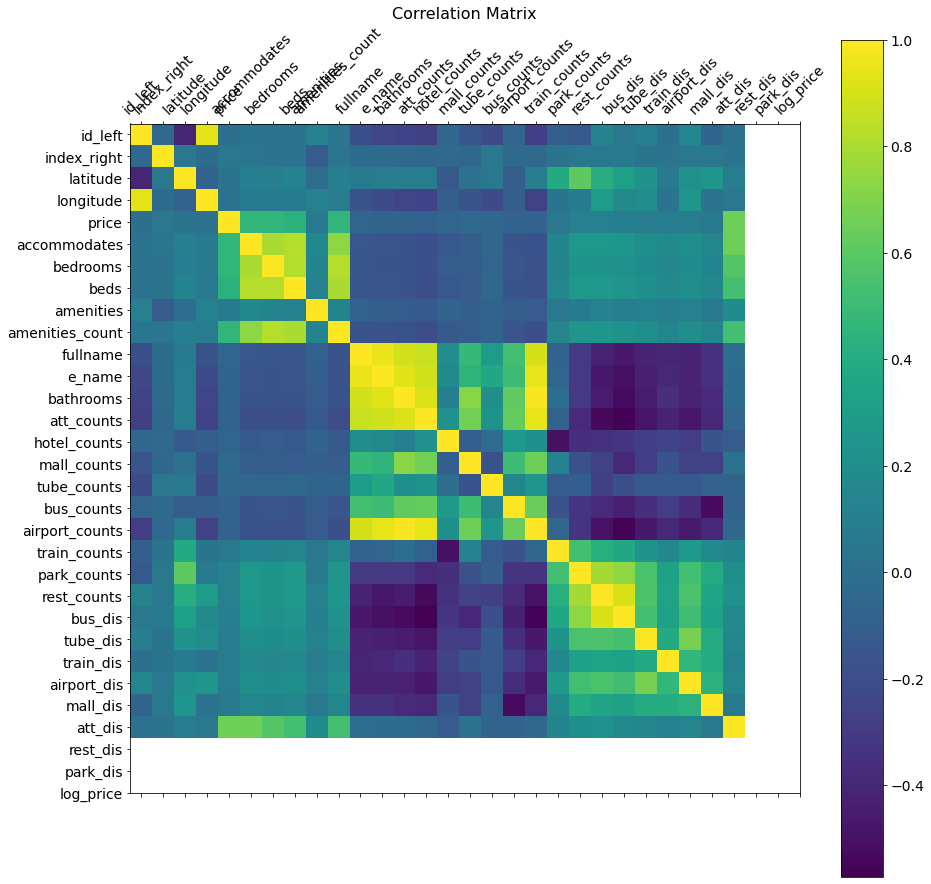

In [89]:
#check corrlation
df = df_final
plt.rcParams["axes.grid"] = False
f = plt.figure(figsize=(15, 15))
plt.matshow(df.corr(), fignum=f.number)
plt.xticks(range(df.shape[1]), df.columns, fontsize=14, rotation=45)
plt.yticks(range(df.shape[1]), df.columns, fontsize=14)
cb = plt.colorbar()
cb.ax.tick_params(labelsize=14)
plt.title('Correlation Matrix', fontsize=16)
# plt.savefig('vif')

In [90]:
# fig, ax = plt.subplots(figsize=(10,10))
# hist1 = df_final.hist(ax=ax, color = '#e67d60')

In [91]:
# df_final1 = df_final[['log_price','accommodates','bedrooms','beds','bathrooms','amenities_count',
#                       'att_dis','att_counts','airport_dis','airport_counts',
#                       'mall_dis','tube_dis','bus_dis','park_counts','rest_dis','log_rental_price']]

df_final1 = df_final[['log_price','accommodates','bedrooms','beds','bathrooms','amenities_count',
                      'att_dis','att_counts','airport_dis','airport_counts',
                      'mall_dis','mall_counts','tube_counts','tube_dis','bus_counts','bus_dis','park_counts','park_dis','rest_dis','rest_counts',
                     'train_dis','train_counts']]


In [92]:
# using VIF on the dataset
df_predictors_selected_VIF = drop_column_using_vif_(df_final1.drop('log_price', axis=1))
# Note that there is a 'while' loop in the drop_column_using_vif_. In each iteration, one variable is dropped.
print("The columns remaining after VIF selection are:")
print(df_predictors_selected_VIF.columns)

/opt/conda/envs/sds2021/lib/python3.9/site-packages/statsmodels/tsa/tsatools.py:142: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only
  x = pd.concat(x[::order], 1)


Dropping: mall_counts
Dropping: rest_counts
Dropping: train_dis
Dropping: tube_counts
The columns remaining after VIF selection are:
Index(['accommodates', 'bedrooms', 'beds', 'bathrooms', 'amenities_count',
       'att_dis', 'att_counts', 'airport_dis', 'airport_counts', 'mall_dis',
       'tube_dis', 'bus_counts', 'bus_dis', 'park_counts', 'park_dis',
       'rest_dis', 'train_counts'],
      dtype='object')


In [93]:
model_airbnb = sm.OLS(endog=df_final1[['log_price']], exog=sm.add_constant(df_predictors_selected_VIF)).fit()
model_airbnb.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              log_price   R-squared:                       0.476
Model:                            OLS   Adj. R-squared:                  0.475
Method:                 Least Squares   F-statistic:                     1469.
Date:                Tue, 09 Aug 2022   Prob (F-statistic):               0.00
Time:                        10:57:18   Log-Likelihood:                -29497.
No. Observations:               27544   AIC:                         5.903e+04
Df Residuals:                   27526   BIC:                         5.918e+04
Df Model:                          17                                         
Covariance Type:            nonrobust                                         
===================================================================================
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
const               5.2397      0.021    252.713      0.000       5.199       5.280
accommodates        0.1600      0.002     66.891      0.000       0.155       0.165
bedrooms            0.0921      0.005     18.783      0.000       0.082       0.102
beds               -0.0577      0.003    -17.188      0.000      -0.064      -0.051
bathrooms           0.0506      0.005     10.709      0.000       0.041       0.060
amenities_count     0.0087      0.000     19.319      0.000       0.008       0.010
att_dis             0.0340      0.008      4.527      0.000       0.019       0.049
att_counts          0.0024      0.000     22.050      0.000       0.002       0.003
airport_dis         0.0029      0.001      3.066      0.002       0.001       0.005
airport_counts      0.1736      0.017     10.163      0.000       0.140       0.207
mall_dis            0.1309      0.023      5.762      0.000       0.086       0.175
tube_dis            0.0080      0.001      6.727      0.000       0.006       0.010
bus_counts         -0.0002      0.000     -1.096      0.273      -0.001       0.000
bus_dis            -0.0086      0.005     -1.831      0.067      -0.018       0.001
park_counts        -0.0096      0.002     -6.301      0.000      -0.013      -0.007
park_dis           -0.0409      0.005     -7.480      0.000      -0.052      -0.030
rest_dis            0.0016      0.017      0.094      0.925      -0.031       0.035
train_counts       -0.0802      0.014     -5.769      0.000      -0.107      -0.053
==============================================================================
Omnibus:                     8348.146   Durbin-Watson:                   1.537
Prob(Omnibus):                  0.000   Jarque-Bera (JB):          1080391.217
Skew:                          -0.335   Prob(JB):                         0.00
Kurtosis:                      33.675   Cond. No.                         509.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

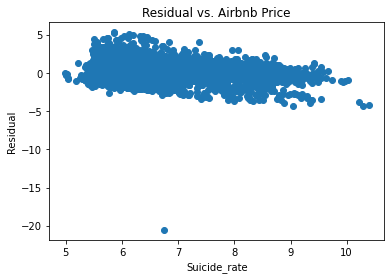

In [94]:
# residual plot
plt.scatter(model_airbnb.fittedvalues, model_airbnb.resid)
# adding title and labels
plt.xlabel('Suicide_rate')
plt.ylabel('Residual')
plt.title('Residual vs. Airbnb Price')
plt.show()

In [95]:
df_final2 = df_final[['log_price','att_dis','att_counts','airport_dis','airport_counts',
                      'mall_dis','mall_counts','tube_counts','tube_dis','bus_counts','bus_dis','park_counts','park_dis','rest_dis','rest_counts',
                     'train_dis','train_counts']]

In [96]:
# using VIF on the dataset
df_predictors_selected_VIF = drop_column_using_vif_(df_final2.drop('log_price', axis=1))
# Note that there is a 'while' loop in the drop_column_using_vif_. In each iteration, one variable is dropped.
print("The columns remaining after VIF selection are:")
print(df_predictors_selected_VIF.columns)

/opt/conda/envs/sds2021/lib/python3.9/site-packages/statsmodels/tsa/tsatools.py:142: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only
  x = pd.concat(x[::order], 1)


Dropping: mall_counts
Dropping: rest_counts
Dropping: train_dis
Dropping: tube_counts
The columns remaining after VIF selection are:
Index(['att_dis', 'att_counts', 'airport_dis', 'airport_counts', 'mall_dis',
       'tube_dis', 'bus_counts', 'bus_dis', 'park_counts', 'park_dis',
       'rest_dis', 'train_counts'],
      dtype='object')


In [97]:
model_airbnb_out = sm.OLS(endog=df_final2[['log_price']], exog=sm.add_constant(df_predictors_selected_VIF)).fit()
model_airbnb_out.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              log_price   R-squared:                       0.071
Model:                            OLS   Adj. R-squared:                  0.071
Method:                 Least Squares   F-statistic:                     175.3
Date:                Tue, 09 Aug 2022   Prob (F-statistic):               0.00
Time:                        10:57:19   Log-Likelihood:                -37376.
No. Observations:               27544   AIC:                         7.478e+04
Df Residuals:                   27531   BIC:                         7.488e+04
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
==================================================================================
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
const              6.0354      0.024    248.726      0.000       5.988       6.083
att_dis            0.1075      0.010     10.771      0.000       0.088       0.127
att_counts         0.0028      0.000     18.721      0.000       0.002       0.003
airport_dis        0.0089      0.001      7.071      0.000       0.006       0.011
airport_counts     0.1125      0.023      4.964      0.000       0.068       0.157
mall_dis           0.2351      0.030      7.783      0.000       0.176       0.294
tube_dis           0.0211      0.002     13.364      0.000       0.018       0.024
bus_counts        -0.0008      0.000     -3.521      0.000      -0.001      -0.000
bus_dis           -0.0087      0.006     -1.393      0.164      -0.021       0.004
park_counts       -0.0169      0.002     -8.385      0.000      -0.021      -0.013
park_dis          -0.0561      0.007     -7.711      0.000      -0.070      -0.042
rest_dis           0.0558      0.022      2.495      0.013       0.012       0.100
train_counts      -0.1341      0.018     -7.267      0.000      -0.170      -0.098
==============================================================================
Omnibus:                     5946.937   Durbin-Watson:                   1.503
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            99883.108
Skew:                           0.587   Prob(JB):                         0.00
Kurtosis:                      12.255   Cond. No.                         498.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

### Spatial Regression

In [98]:
!pip install hvplot

In [99]:
from pysal.model import spreg
from pysal.lib import weights
from pysal.explore import esda
import hvplot.pandas
from scipy import stats
import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import seaborn as sns
import osmnx as ox

In [100]:
# transform data
df_g = gpd.GeoDataFrame(df_final, geometry=gpd.points_from_xy(df_final.longitude, df_final.latitude, crs='epsg:4326'))
df_g = df_g.to_crs('epsg:4326')

In [101]:
explanatory_vars = ['accommodates','bedrooms','beds','bathrooms','amenities_count',
                      'att_dis','att_counts','airport_dis','airport_counts',
                      'mall_dis','mall_counts','tube_counts','tube_dis','bus_counts','bus_dis','park_counts','park_dis','rest_dis','rest_counts',
                    'train_dis','train_counts']

# explanatory_vars = ['att_dis','att_counts','airport_dis','airport_counts',
#                       'mall_dis','mall_counts','tube_counts','tube_dis','bus_counts','bus_dis','park_counts','park_dis','rest_dis','rest_counts',
#                      'hotel_counts','train_dis','train_counts']

In [102]:
m1 = spreg.OLS(df_g[['log_price']].values, df_g[explanatory_vars].values, 
                  name_y = 'log_price', name_x = explanatory_vars)

In [103]:
print(m1.summary)

REGRESSION
----------
SUMMARY OF OUTPUT: ORDINARY LEAST SQUARES
-----------------------------------------
Data set            :     unknown
Weights matrix      :        None
Dependent Variable  :   log_price                Number of Observations:       27544
Mean dependent var  :      6.2637                Number of Variables   :          22
S.D. dependent var  :      0.9751                Degrees of Freedom    :       27522
R-squared           :      0.4783
Adjusted R-squared  :      0.4779
Sum squared residual:   13662.982                F-statistic           :   1201.7008
Sigma-square        :       0.496                Prob(F-statistic)     :           0
S.E. of regression  :       0.705                Log likelihood        :  -29427.768
Sigma-square ML     :       0.496                Akaike info criterion :   58899.537
S.E of regression ML:      0.7043                Schwarz criterion     :   59080.454

-----------------------------------------------------------------------------

/opt/conda/envs/sds2021/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


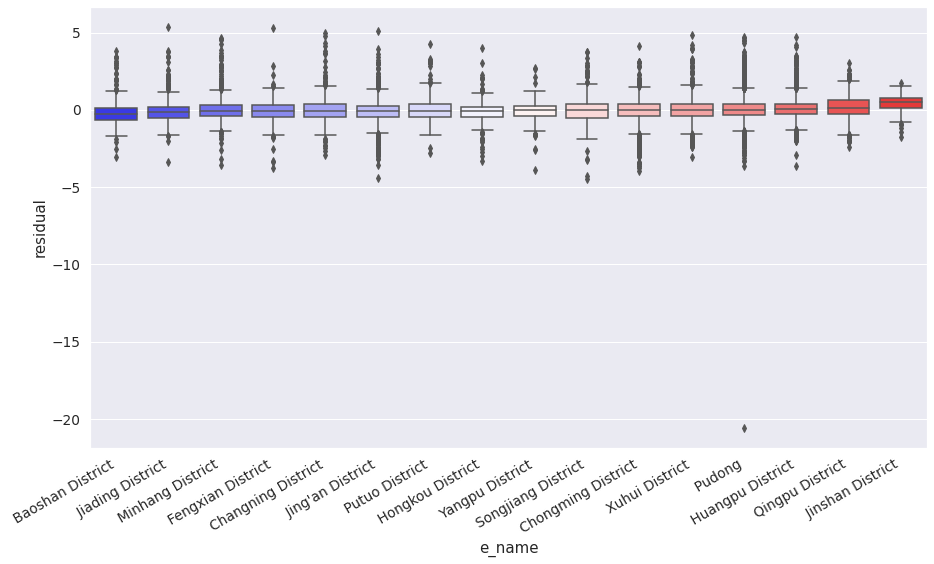

In [104]:
# Create column with residual values from m1
df_g['residual'] = m1.u
# Obtain the median value of residuals in each neighbourhood
medians = df_g.groupby(
    "e_name"
).residual.median().to_frame(
    'hood_residual'
)

# Increase fontsize
sns.set(font_scale = 1.25)
# Set up figure
f = plt.figure(figsize=(15,9))
# Grab figure's axis
ax = plt.gca()
# Generate bloxplot of values by neighbourhood
# Note the data includes the median values merged on-the-fly
sns.boxplot(
    'e_name', 
    'residual', 
    ax = ax,
    data=df_g.merge(
        medians, 
        how='left',
        left_on='e_name',
        right_index=True
    ).sort_values(
        'hood_residual'), palette='bwr'
)
# Auto-format of the X labels
f.autofmt_xdate()
# Display
plt.show()

In [105]:
w = weights.KNN.from_dataframe(df_g, k=100)
w.transform = 'R'
w

In [106]:
df_g['lag'] = weights.lag_spatial(w, df_g[['log_price']].values)

In [107]:
mi = esda.Moran(df_g['lag'],w)
mi

In [108]:
mi.I

0.9282065004038064

In [109]:
mi.p_sim

0.001

In [110]:
m3 = spreg.GM_Lag(df_g[['log_price']].values, df_g[explanatory_vars].values, 
                  w=w,
                  name_y = 'ln(price)', name_x = explanatory_vars)

In [111]:
print(m3.summary)

REGRESSION
----------
SUMMARY OF OUTPUT: SPATIAL TWO STAGE LEAST SQUARES
--------------------------------------------------
Data set            :     unknown
Weights matrix      :     unknown
Dependent Variable  :   ln(price)                Number of Observations:       27544
Mean dependent var  :      6.2637                Number of Variables   :          23
S.D. dependent var  :      0.9751                Degrees of Freedom    :       27521
Pseudo R-squared    :      0.5121
Spatial Pseudo R-squared:  0.4851

------------------------------------------------------------------------------------
            Variable     Coefficient       Std.Error     z-Statistic     Probability
------------------------------------------------------------------------------------
            CONSTANT       2.6701407       0.1006818      26.5205855       0.0000000
        accommodates       0.1523116       0.0023274      65.4440724       0.0000000
            bedrooms       0.0857772       0.0047395      1

In [112]:
from sklearn.metrics import mean_squared_error as mse

mses = pd.Series({'OLS': mse(df_g["log_price"], m1.predy.flatten()), \
                  'Lag': mse(df_g["log_price"], m3.predy_e)
                    })
mses.sort_values()

Lag    0.489611
OLS    0.496042
dtype: float64

In [113]:
# df_final.to_csv('list_gdf.csv')

### GWR

In [114]:
!pip install stargazer

In [115]:
# Load libraries
import numpy as np
import pandas as pd
pd.set_option('display.max_columns', None)

import matplotlib.pyplot as plt
from matplotlib.ticker import FormatStrFormatter
from pylab import rcParams
import matplotlib as mpl
mpl.rcParams['figure.dpi'] = 72

import seaborn as sns
sns.set_style("darkgrid")
sns.set_context(context="paper", font_scale=1.5, rc=None)
sns.set(font="serif")

import plotly.express as px
import plotly.graph_objects as go

import geopandas as gpd


import libpysal as ps
from libpysal  import weights
from libpysal.weights import Queen

import esda
from esda.moran import Moran, Moran_Local

import splot
from splot.esda import moran_scatterplot, plot_moran, lisa_cluster, plot_local_autocorrelation
from splot.libpysal import plot_spatial_weights

from giddy.directional import Rose

import statsmodels.api as sm
import statsmodels.formula.api as smf
from stargazer.stargazer import Stargazer, LineLocation

from spreg import OLS
from spreg import MoranRes
from spreg import ML_Lag
from spreg import ML_Error 

from mgwr.gwr import GWR, MGWR
from mgwr.sel_bw import Sel_BW
from mgwr.utils import shift_colormap, truncate_colormap

import warnings
warnings.filterwarnings('ignore') 
import time

In [175]:
df_gwr = df_final.sample(frac=0.3, random_state=10)

In [176]:
g_y = df_gwr['log_price'].values.reshape((-1,1))
g_y.shape

(8263, 1)

In [177]:
g_X = df_gwr[['accommodates','bedrooms','beds','bathrooms','amenities_count',
                      'att_dis','att_counts','airport_dis','airport_counts',
                      'mall_dis','mall_counts','tube_counts','tube_dis','bus_counts','bus_dis','park_counts','park_dis','rest_dis','rest_counts',
                     'train_dis','train_counts']].values
g_X.shape

(8263, 21)

In [178]:
g_X = (g_X - g_X.mean(axis=0)) / g_X.std(axis=0)
g_y = g_y.reshape((-1,1))
g_y = (g_y - g_y.mean(axis=0)) / g_y.std(axis=0)

In [179]:
u = df_gwr['longitude']
v = df_gwr['latitude']
g_coords = list(zip(u,v))
g_coords[0:5]

[(121.67033, 31.13086),
 (121.60996, 31.17907),
 (121.91245, 30.90358),
 (121.44031, 31.19721),
 (121.45178, 31.23501)]

In [180]:
gwr_selector = Sel_BW(g_coords, g_y, g_X, kernel='gaussian')
gwr_bw = gwr_selector.search(criterion='AIC')
gwr_bw 

113.0

In [185]:
gwr_results = GWR(g_coords, g_y, g_X, gwr_bw, kernel='gaussian').fit()
gwr_results.summary()

Model type                                                         Gaussian
Number of observations:                                                8263
Number of covariates:                                                    22

Global Regression Results
---------------------------------------------------------------------------
Residual sum of squares:                                           4057.419
Log-likelihood:                                                   -8786.198
AIC:                                                              17616.396
AICc:                                                             17618.530
BIC:                                                             -70272.635
R2:                                                                   0.509
Adj. R2:                                                              0.508

Variable                              Est.         SE  t(Est/SE)    p-value
------------------------------- ---------- ---------- ------

In [186]:
# Add GWR parameters to GeoDataframe
df_gwr['gwr_x0'] = gwr_results.params[:,0]
df_gwr['gwr_x1_accommodates'] = gwr_results.params[:,1]
df_gwr['gwr_x2_bedrooms'] = gwr_results.params[:,2]
df_gwr['gwr_x3_beds'] = gwr_results.params[:,3]
df_gwr['gwr_x4_bathrooms'] = gwr_results.params[:,4]
df_gwr['gwr_x5_amenities_count'] = gwr_results.params[:,5]
df_gwr['gwr_x6_att_dis'] = gwr_results.params[:,6]
df_gwr['gwr_x7_att_counts'] = gwr_results.params[:,7]
df_gwr['gwr_x8_airport_dis'] = gwr_results.params[:,8]
df_gwr['gwr_x9_airpot_counts'] = gwr_results.params[:,9]
df_gwr['gwr_x10_mall_dis'] = gwr_results.params[:,10]
df_gwr['gwr_x11_mall_counts'] = gwr_results.params[:,11]
df_gwr['gwr_x12_tube_counts'] = gwr_results.params[:,12]
df_gwr['gwr_x13_tube_dis'] = gwr_results.params[:,13]
df_gwr['gwr_x14_bus_counts'] = gwr_results.params[:,14]
df_gwr['gwr_x15_bus_dis'] = gwr_results.params[:,15]
df_gwr['gwr_x16_park_counts'] = gwr_results.params[:,16]
df_gwr['gwr_x17_park_dis'] = gwr_results.params[:,17]
df_gwr['gwr_x18_rest_dis'] = gwr_results.params[:,18]
df_gwr['gwr_x19_rest_counts'] = gwr_results.params[:,19]
df_gwr['gwr_x20_train_dis'] = gwr_results.params[:,20]
df_gwr['gwr_x21_train_counts'] = gwr_results.params[:,21]

In [187]:
gwr_filtered_t = gwr_results.filter_tvals()

In [188]:
# transform data
df_gwr = gpd.GeoDataFrame(df_gwr, geometry=gpd.points_from_xy(df_gwr.longitude, df_gwr.latitude, crs='epsg:4326'))
df_gwr = df_gwr.to_crs('epsg:4326')

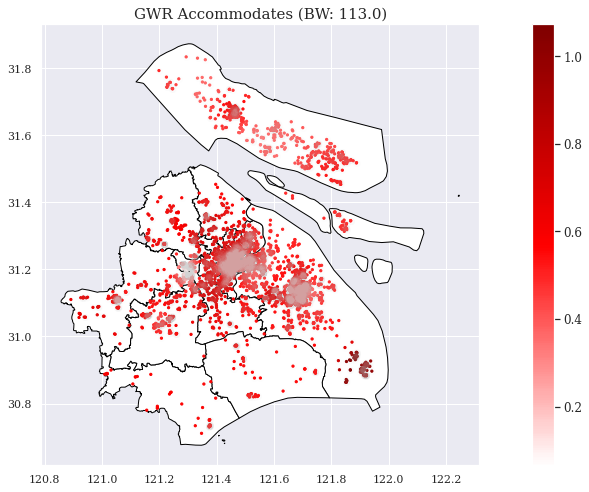

In [369]:
#Prep plot and add axis
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(15,7))
sssh.plot(ax=ax, edgecolor='black', facecolor='white', linewidth=1, figsize=(20,10))
ax.set_title('GWR Accommodates (BW: ' + str(gwr_bw) +')', fontsize=15)

#Set color map
cmap = plt.cm.seismic

#Find min and max values of the combined dataset
gwr_min = df_gwr['gwr_x1_accommodates'].min()
gwr_max = df_gwr['gwr_x1_accommodates'].max()
vmin = np.min([gwr_min])
vmax = np.max([gwr_max])

#If all values are negative use the negative half of the colormap
if (vmin < 0) & (vmax < 0):
    cmap = truncate_colormap(cmap, 0.0, 0.5)
#If all values are positive use the positive half of the colormap
elif (vmin > 0) & (vmax > 0):
    cmap = truncate_colormap(cmap, 0.5, 1.0)
#Otherwise, there are positive and negative values so the colormap so zero is the midpoint
else:
    cmap = shift_colormap(cmap, start=0.0, midpoint=1 - vmax/(vmax + abs(vmin)), stop=1.)

#Create scalar mappable for colorbar and stretch colormap across range of data values
sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=vmin, vmax=vmax))

#Plot GWR parameters
df_gwr.plot('gwr_x1_accommodates', cmap=sm.cmap, ax=ax, s=5, vmin=vmin, vmax=vmax, **{'alpha':1})
#If there are insignificnt parameters plot gray polygons over them
if (gwr_filtered_t[:,0] == 0).any():
    df_gwr[gwr_filtered_t[:,0] == 0].plot(color='lightgrey', ax=ax, **{'alpha':0.02})

#Set figure options and plot 
fig.tight_layout()    
sm._A = []
cbar = fig.colorbar(sm)
cbar.ax.tick_params(labelsize=12) 
ax.get_xaxis().set_visible(True)
ax.get_yaxis().set_visible(True)
plt.show()

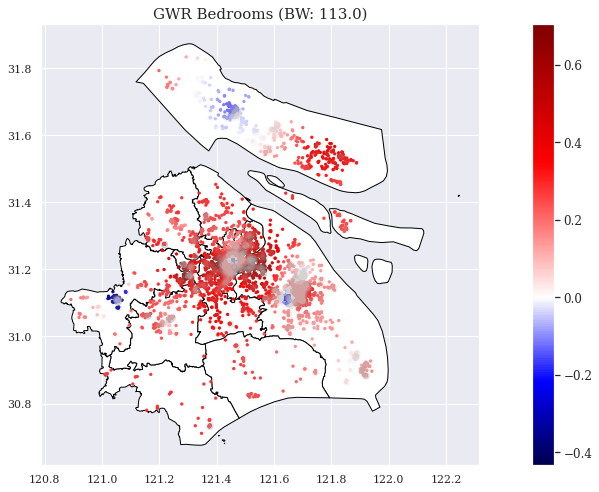

In [370]:
#Prep plot and add axis
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(15,7))
sssh.plot(ax=ax, edgecolor='black', facecolor='white', linewidth=1, figsize=(20,10))
ax.set_title('GWR Bedrooms (BW: ' + str(gwr_bw) +')', fontsize=15)

#Set color map
cmap = plt.cm.seismic

#Find min and max values of the combined dataset
gwr_min = df_gwr['gwr_x2_bedrooms'].min()
gwr_max = df_gwr['gwr_x2_bedrooms'].max()
vmin = np.min([gwr_min])
vmax = np.max([gwr_max])

#If all values are negative use the negative half of the colormap
if (vmin < 0) & (vmax < 0):
    cmap = truncate_colormap(cmap, 0.0, 0.5)
#If all values are positive use the positive half of the colormap
elif (vmin > 0) & (vmax > 0):
    cmap = truncate_colormap(cmap, 0.5, 1.0)
#Otherwise, there are positive and negative values so the colormap so zero is the midpoint
else:
    cmap = shift_colormap(cmap, start=0.0, midpoint=1 - vmax/(vmax + abs(vmin)), stop=1.)

#Create scalar mappable for colorbar and stretch colormap across range of data values
sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=vmin, vmax=vmax))

#Plot GWR parameters
df_gwr.plot('gwr_x2_bedrooms', cmap=sm.cmap, ax=ax, s=5, vmin=vmin, vmax=vmax, **{'alpha':1})
#If there are insignificnt parameters plot gray polygons over them
if (gwr_filtered_t[:,0] == 0).any():
    df_gwr[gwr_filtered_t[:,0] == 0].plot(color='lightgrey', ax=ax, **{'alpha':0.02})

#Set figure options and plot 
fig.tight_layout()    
sm._A = []
cbar = fig.colorbar(sm)
cbar.ax.tick_params(labelsize=12) 
ax.get_xaxis().set_visible(True)
ax.get_yaxis().set_visible(True)
plt.show()

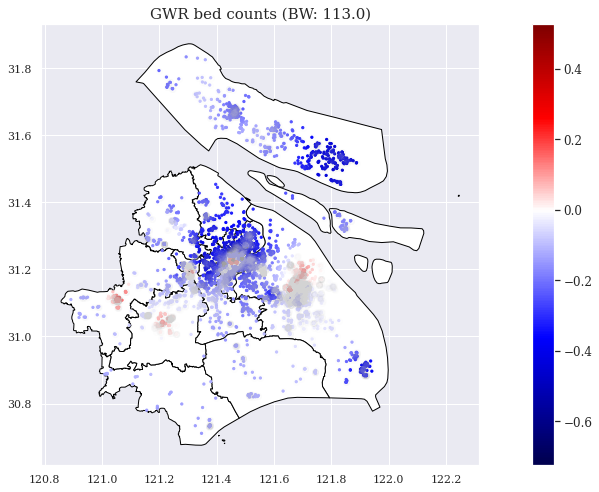

In [371]:
#Prep plot and add axis
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(15,7))
sssh.plot(ax=ax, edgecolor='black', facecolor='white', linewidth=1, figsize=(20,10))
ax.set_title('GWR bed counts (BW: ' + str(gwr_bw) +')', fontsize=15)

#Set color map
cmap = plt.cm.seismic

#Find min and max values of the combined dataset
gwr_min = df_gwr['gwr_x3_beds'].min()
gwr_max = df_gwr['gwr_x3_beds'].max()
vmin = np.min([gwr_min])
vmax = np.max([gwr_max])

#If all values are negative use the negative half of the colormap
if (vmin < 0) & (vmax < 0):
    cmap = truncate_colormap(cmap, 0.0, 0.5)
#If all values are positive use the positive half of the colormap
elif (vmin > 0) & (vmax > 0):
    cmap = truncate_colormap(cmap, 0.5, 1.0)
#Otherwise, there are positive and negative values so the colormap so zero is the midpoint
else:
    cmap = shift_colormap(cmap, start=0.0, midpoint=1 - vmax/(vmax + abs(vmin)), stop=1.)

#Create scalar mappable for colorbar and stretch colormap across range of data values
sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=vmin, vmax=vmax))

#Plot GWR parameters
df_gwr.plot('gwr_x3_beds', cmap=sm.cmap, ax=ax, s=5, vmin=vmin, vmax=vmax, **{'alpha':1})
#If there are insignificnt parameters plot gray polygons over them
if (gwr_filtered_t[:,0] == 0).any():
    df_gwr[gwr_filtered_t[:,0] == 0].plot(color='lightgrey', ax=ax, **{'alpha':0.02})

#Set figure options and plot 
fig.tight_layout()    
sm._A = []
cbar = fig.colorbar(sm)
cbar.ax.tick_params(labelsize=12) 
ax.get_xaxis().set_visible(True)
ax.get_yaxis().set_visible(True)
plt.show()

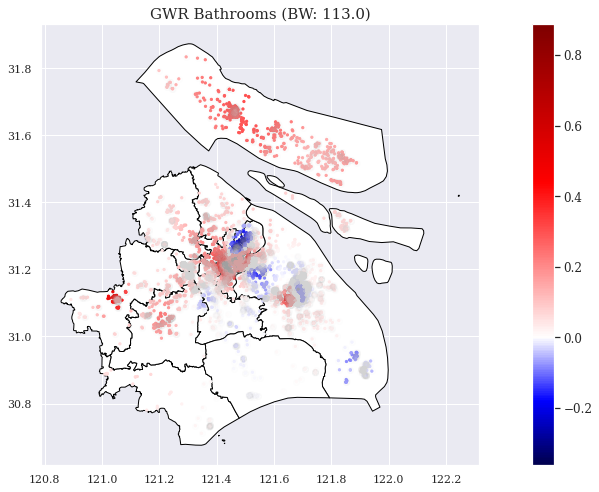

In [372]:
#Prep plot and add axis
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(15,7))
sssh.plot(ax=ax, edgecolor='black', facecolor='white', linewidth=1, figsize=(20,10))
ax.set_title('GWR Bathrooms (BW: ' + str(gwr_bw) +')', fontsize=15)

#Set color map
cmap = plt.cm.seismic

#Find min and max values of the combined dataset
gwr_min = df_gwr['gwr_x4_bathrooms'].min()
gwr_max = df_gwr['gwr_x4_bathrooms'].max()
vmin = np.min([gwr_min])
vmax = np.max([gwr_max])

#If all values are negative use the negative half of the colormap
if (vmin < 0) & (vmax < 0):
    cmap = truncate_colormap(cmap, 0.0, 0.5)
#If all values are positive use the positive half of the colormap
elif (vmin > 0) & (vmax > 0):
    cmap = truncate_colormap(cmap, 0.5, 1.0)
#Otherwise, there are positive and negative values so the colormap so zero is the midpoint
else:
    cmap = shift_colormap(cmap, start=0.0, midpoint=1 - vmax/(vmax + abs(vmin)), stop=1.)

#Create scalar mappable for colorbar and stretch colormap across range of data values
sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=vmin, vmax=vmax))

#Plot GWR parameters
df_gwr.plot('gwr_x4_bathrooms', cmap=sm.cmap, ax=ax, s=5, vmin=vmin, vmax=vmax, **{'alpha':1})
#If there are insignificnt parameters plot gray polygons over them
if (gwr_filtered_t[:,0] == 0).any():
    df_gwr[gwr_filtered_t[:,0] == 0].plot(color='lightgrey', ax=ax, **{'alpha':0.02})

#Set figure options and plot 
fig.tight_layout()    
sm._A = []
cbar = fig.colorbar(sm)
cbar.ax.tick_params(labelsize=12) 
ax.get_xaxis().set_visible(True)
ax.get_yaxis().set_visible(True)
plt.show()

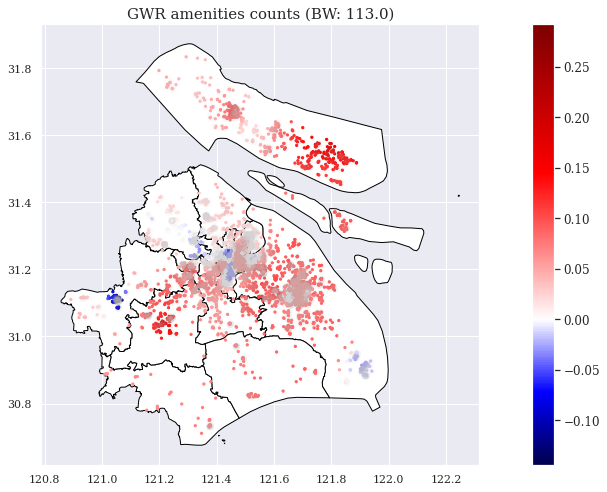

In [373]:
#Prep plot and add axis
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(15,7))
sssh.plot(ax=ax, edgecolor='black', facecolor='white', linewidth=1, figsize=(20,10))
ax.set_title('GWR amenities counts (BW: ' + str(gwr_bw) +')', fontsize=15)

#Set color map
cmap = plt.cm.seismic

#Find min and max values of the combined dataset
gwr_min = df_gwr['gwr_x5_amenities_count'].min()
gwr_max = df_gwr['gwr_x5_amenities_count'].max()
vmin = np.min([gwr_min])
vmax = np.max([gwr_max])

#If all values are negative use the negative half of the colormap
if (vmin < 0) & (vmax < 0):
    cmap = truncate_colormap(cmap, 0.0, 0.5)
#If all values are positive use the positive half of the colormap
elif (vmin > 0) & (vmax > 0):
    cmap = truncate_colormap(cmap, 0.5, 1.0)
#Otherwise, there are positive and negative values so the colormap so zero is the midpoint
else:
    cmap = shift_colormap(cmap, start=0.0, midpoint=1 - vmax/(vmax + abs(vmin)), stop=1.)

#Create scalar mappable for colorbar and stretch colormap across range of data values
sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=vmin, vmax=vmax))

#Plot GWR parameters
df_gwr.plot('gwr_x5_amenities_count', cmap=sm.cmap, ax=ax, s=5, vmin=vmin, vmax=vmax, **{'alpha':1})
#If there are insignificnt parameters plot gray polygons over them
if (gwr_filtered_t[:,0] == 0).any():
    df_gwr[gwr_filtered_t[:,0] == 0].plot(color='lightgrey', ax=ax, **{'alpha':0.02})

#Set figure options and plot 
fig.tight_layout()    
sm._A = []
cbar = fig.colorbar(sm)
cbar.ax.tick_params(labelsize=12) 
ax.get_xaxis().set_visible(True)
ax.get_yaxis().set_visible(True)
plt.show()

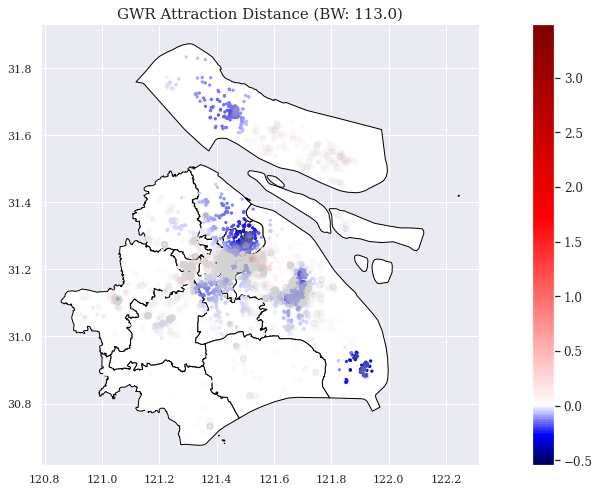

In [374]:
#Prep plot and add axis
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(15,7))
sssh.plot(ax=ax, edgecolor='black', facecolor='white', linewidth=1, figsize=(20,10))
ax.set_title('GWR Attraction Distance (BW: ' + str(gwr_bw) +')', fontsize=15)

#Set color map
cmap = plt.cm.seismic

#Find min and max values of the combined dataset
gwr_min = df_gwr['gwr_x6_att_dis'].min()
gwr_max = df_gwr['gwr_x6_att_dis'].max()
vmin = np.min([gwr_min])
vmax = np.max([gwr_max])

#If all values are negative use the negative half of the colormap
if (vmin < 0) & (vmax < 0):
    cmap = truncate_colormap(cmap, 0.0, 0.5)
#If all values are positive use the positive half of the colormap
elif (vmin > 0) & (vmax > 0):
    cmap = truncate_colormap(cmap, 0.5, 1.0)
#Otherwise, there are positive and negative values so the colormap so zero is the midpoint
else:
    cmap = shift_colormap(cmap, start=0.0, midpoint=1 - vmax/(vmax + abs(vmin)), stop=1.)

#Create scalar mappable for colorbar and stretch colormap across range of data values
sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=vmin, vmax=vmax))

#Plot GWR parameters
df_gwr.plot('gwr_x6_att_dis', cmap=sm.cmap, ax=ax, s=5, vmin=vmin, vmax=vmax, **{'alpha':1})
#If there are insignificnt parameters plot gray polygons over them
if (gwr_filtered_t[:,0] == 0).any():
    df_gwr[gwr_filtered_t[:,0] == 0].plot(color='lightgrey', ax=ax, **{'alpha':0.02})

#Set figure options and plot 
fig.tight_layout()    
sm._A = []
cbar = fig.colorbar(sm)
cbar.ax.tick_params(labelsize=12) 
ax.get_xaxis().set_visible(True)
ax.get_yaxis().set_visible(True)
plt.show()

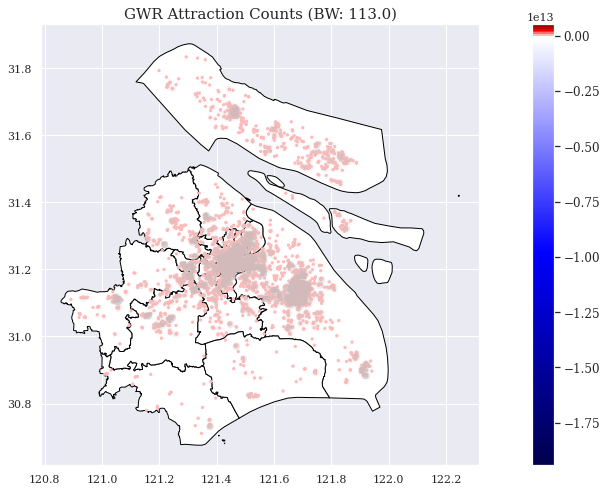

In [375]:
#Prep plot and add axis
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(15,7))
sssh.plot(ax=ax, edgecolor='black', facecolor='white', linewidth=1, figsize=(20,10))
ax.set_title('GWR Attraction Counts (BW: ' + str(gwr_bw) +')', fontsize=15)

#Set color map
cmap = plt.cm.seismic

#Find min and max values of the combined dataset
gwr_min = df_gwr['gwr_x7_att_counts'].min()
gwr_max = df_gwr['gwr_x7_att_counts'].max()
vmin = np.min([gwr_min])
vmax = np.max([gwr_max])

#If all values are negative use the negative half of the colormap
if (vmin < 0) & (vmax < 0):
    cmap = truncate_colormap(cmap, 0.0, 0.5)
#If all values are positive use the positive half of the colormap
elif (vmin > 0) & (vmax > 0):
    cmap = truncate_colormap(cmap, 0.5, 1.0)
#Otherwise, there are positive and negative values so the colormap so zero is the midpoint
else:
    cmap = shift_colormap(cmap, start=0.0, midpoint=1 - vmax/(vmax + abs(vmin)), stop=1.)

#Create scalar mappable for colorbar and stretch colormap across range of data values
sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=vmin, vmax=vmax))

#Plot GWR parameters
df_gwr.plot('gwr_x7_att_counts', cmap=sm.cmap, ax=ax, s=5, vmin=vmin, vmax=vmax, **{'alpha':1})
#If there are insignificnt parameters plot gray polygons over them
if (gwr_filtered_t[:,0] == 0).any():
    df_gwr[gwr_filtered_t[:,0] == 0].plot(color='lightgrey', ax=ax, **{'alpha':0.02})

#Set figure options and plot 
fig.tight_layout()    
sm._A = []
cbar = fig.colorbar(sm)
cbar.ax.tick_params(labelsize=12) 
ax.get_xaxis().set_visible(True)
ax.get_yaxis().set_visible(True)
plt.show()

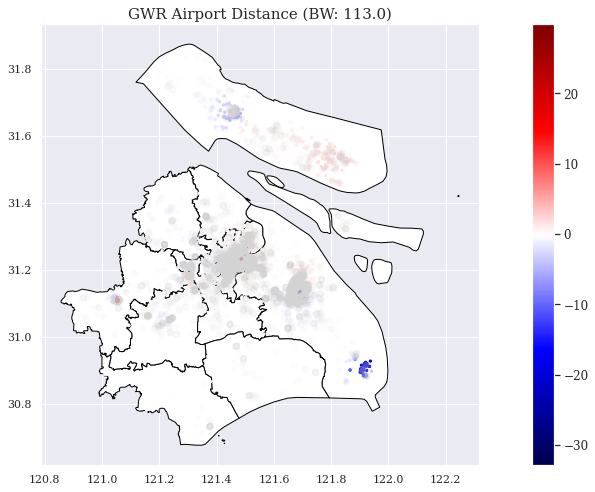

In [376]:
#Prep plot and add axis
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(15,7))
sssh.plot(ax=ax, edgecolor='black', facecolor='white', linewidth=1, figsize=(20,10))
ax.set_title('GWR Airport Distance (BW: ' + str(gwr_bw) +')', fontsize=15)

#Set color map
cmap = plt.cm.seismic

#Find min and max values of the combined dataset
gwr_min = df_gwr['gwr_x8_airport_dis'].min()
gwr_max = df_gwr['gwr_x8_airport_dis'].max()
vmin = np.min([gwr_min])
vmax = np.max([gwr_max])

#If all values are negative use the negative half of the colormap
if (vmin < 0) & (vmax < 0):
    cmap = truncate_colormap(cmap, 0.0, 0.5)
#If all values are positive use the positive half of the colormap
elif (vmin > 0) & (vmax > 0):
    cmap = truncate_colormap(cmap, 0.5, 1.0)
#Otherwise, there are positive and negative values so the colormap so zero is the midpoint
else:
    cmap = shift_colormap(cmap, start=0.0, midpoint=1 - vmax/(vmax + abs(vmin)), stop=1.)

#Create scalar mappable for colorbar and stretch colormap across range of data values
sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=vmin, vmax=vmax))

#Plot GWR parameters
df_gwr.plot('gwr_x8_airport_dis', cmap=sm.cmap, ax=ax, s=5, vmin=vmin, vmax=vmax, **{'alpha':1})
#If there are insignificnt parameters plot gray polygons over them
if (gwr_filtered_t[:,0] == 0).any():
    df_gwr[gwr_filtered_t[:,0] == 0].plot(color='lightgrey', ax=ax, **{'alpha':0.02})

#Set figure options and plot 
fig.tight_layout()    
sm._A = []
cbar = fig.colorbar(sm)
cbar.ax.tick_params(labelsize=12) 
ax.get_xaxis().set_visible(True)
ax.get_yaxis().set_visible(True)
plt.show()

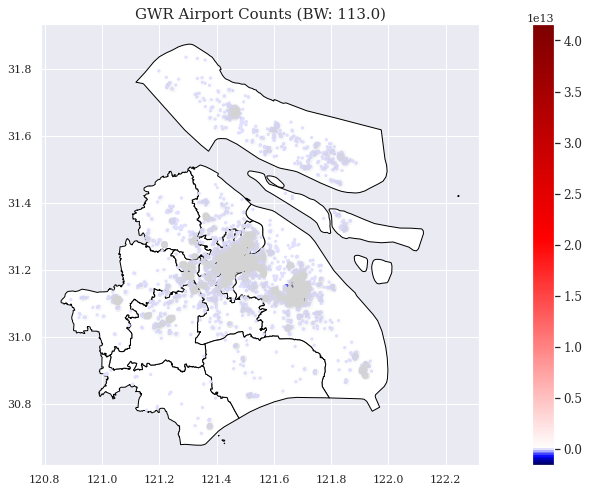

In [377]:
#Prep plot and add axis
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(15,7))
sssh.plot(ax=ax, edgecolor='black', facecolor='white', linewidth=1, figsize=(20,10))
ax.set_title('GWR Airport Counts (BW: ' + str(gwr_bw) +')', fontsize=15)

#Set color map
cmap = plt.cm.seismic

#Find min and max values of the combined dataset
gwr_min = df_gwr['gwr_x9_airpot_counts'].min()
gwr_max = df_gwr['gwr_x9_airpot_counts'].max()
vmin = np.min([gwr_min])
vmax = np.max([gwr_max])

#If all values are negative use the negative half of the colormap
if (vmin < 0) & (vmax < 0):
    cmap = truncate_colormap(cmap, 0.0, 0.5)
#If all values are positive use the positive half of the colormap
elif (vmin > 0) & (vmax > 0):
    cmap = truncate_colormap(cmap, 0.5, 1.0)
#Otherwise, there are positive and negative values so the colormap so zero is the midpoint
else:
    cmap = shift_colormap(cmap, start=0.0, midpoint=1 - vmax/(vmax + abs(vmin)), stop=1.)

#Create scalar mappable for colorbar and stretch colormap across range of data values
sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=vmin, vmax=vmax))

#Plot GWR parameters
df_gwr.plot('gwr_x9_airpot_counts', cmap=sm.cmap, ax=ax, s=5, vmin=vmin, vmax=vmax, **{'alpha':1})
#If there are insignificnt parameters plot gray polygons over them
if (gwr_filtered_t[:,0] == 0).any():
    df_gwr[gwr_filtered_t[:,0] == 0].plot(color='lightgrey', ax=ax, **{'alpha':0.02})

#Set figure options and plot 
fig.tight_layout()    
sm._A = []
cbar = fig.colorbar(sm)
cbar.ax.tick_params(labelsize=12) 
ax.get_xaxis().set_visible(True)
ax.get_yaxis().set_visible(True)
plt.show()

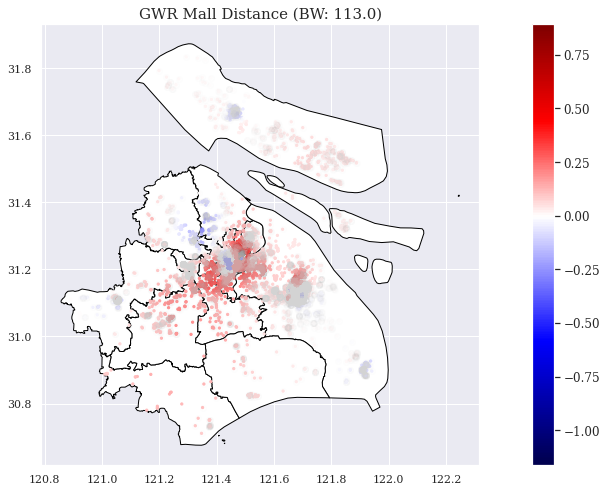

In [378]:
#Prep plot and add axis
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(15,7))
sssh.plot(ax=ax, edgecolor='black', facecolor='white', linewidth=1, figsize=(20,10))
ax.set_title('GWR Mall Distance (BW: ' + str(gwr_bw) +')', fontsize=15)

#Set color map
cmap = plt.cm.seismic

#Find min and max values of the combined dataset
gwr_min = df_gwr['gwr_x10_mall_dis'].min()
gwr_max = df_gwr['gwr_x10_mall_dis'].max()
vmin = np.min([gwr_min])
vmax = np.max([gwr_max])

#If all values are negative use the negative half of the colormap
if (vmin < 0) & (vmax < 0):
    cmap = truncate_colormap(cmap, 0.0, 0.5)
#If all values are positive use the positive half of the colormap
elif (vmin > 0) & (vmax > 0):
    cmap = truncate_colormap(cmap, 0.5, 1.0)
#Otherwise, there are positive and negative values so the colormap so zero is the midpoint
else:
    cmap = shift_colormap(cmap, start=0.0, midpoint=1 - vmax/(vmax + abs(vmin)), stop=1.)

#Create scalar mappable for colorbar and stretch colormap across range of data values
sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=vmin, vmax=vmax))

#Plot GWR parameters
df_gwr.plot('gwr_x10_mall_dis', cmap=sm.cmap, ax=ax, s=5, vmin=vmin, vmax=vmax, **{'alpha':1})
#If there are insignificnt parameters plot gray polygons over them
if (gwr_filtered_t[:,0] == 0).any():
    df_gwr[gwr_filtered_t[:,0] == 0].plot(color='lightgrey', ax=ax, **{'alpha':0.02})

#Set figure options and plot 
fig.tight_layout()    
sm._A = []
cbar = fig.colorbar(sm)
cbar.ax.tick_params(labelsize=12) 
ax.get_xaxis().set_visible(True)
ax.get_yaxis().set_visible(True)
plt.show()

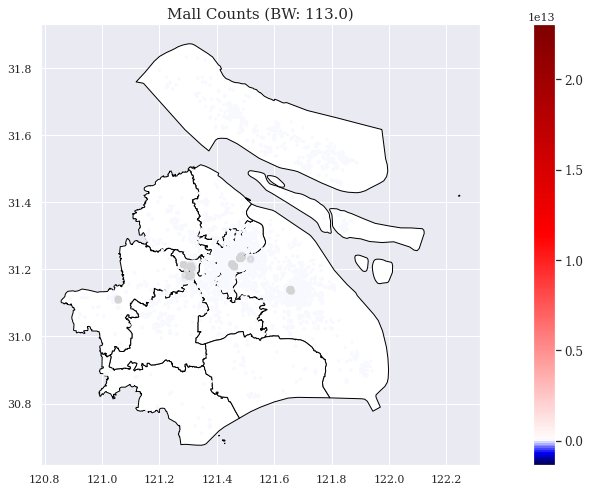

In [379]:
#Prep plot and add axis
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(15,7))
sssh.plot(ax=ax, edgecolor='black', facecolor='white', linewidth=1, figsize=(20,10))
ax.set_title('Mall Counts (BW: ' + str(gwr_bw) +')', fontsize=15)

#Set color map
cmap = plt.cm.seismic

#Find min and max values of the combined dataset
gwr_min = df_gwr['gwr_x11_mall_counts'].min()
gwr_max = df_gwr['gwr_x11_mall_counts'].max()
vmin = np.min([gwr_min])
vmax = np.max([gwr_max])

#If all values are negative use the negative half of the colormap
if (vmin < 0) & (vmax < 0):
    cmap = truncate_colormap(cmap, 0.0, 0.5)
#If all values are positive use the positive half of the colormap
elif (vmin > 0) & (vmax > 0):
    cmap = truncate_colormap(cmap, 0.5, 1.0)
#Otherwise, there are positive and negative values so the colormap so zero is the midpoint
else:
    cmap = shift_colormap(cmap, start=0.0, midpoint=1 - vmax/(vmax + abs(vmin)), stop=1.)

#Create scalar mappable for colorbar and stretch colormap across range of data values
sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=vmin, vmax=vmax))

#Plot GWR parameters
df_gwr.plot('gwr_x11_mall_counts', cmap=sm.cmap, ax=ax, s=5, vmin=vmin, vmax=vmax, **{ 'alpha':1})
#If there are insignificnt parameters plot gray polygons over them
if (gwr_filtered_t[:,1] == 0).any():
    df_gwr[gwr_filtered_t[:,1] == 0].plot(color='lightgrey', ax=ax, **{'alpha':0.02})

#Set figure options and plot 
fig.tight_layout()    
sm._A = []
cbar = fig.colorbar(sm)
cbar.ax.tick_params(labelsize=12) 
ax.get_xaxis().set_visible(True)
ax.get_yaxis().set_visible(True)

plt.show()

#everybody, strongest in north (aceh) gradiation to south

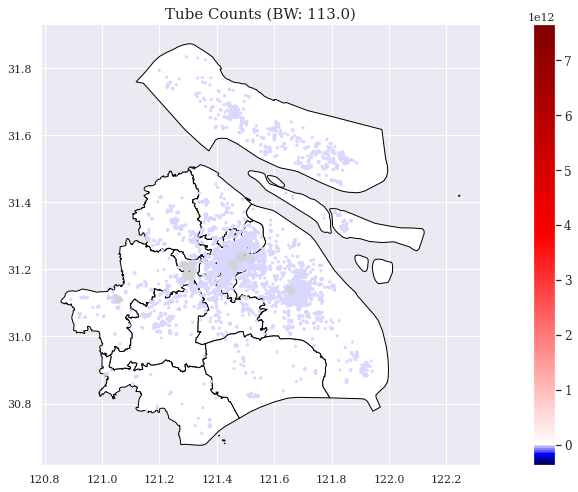

In [380]:
#Prep plot and add axis
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(15,7))
sssh.plot(ax=ax, edgecolor='black', facecolor='white', linewidth=1, figsize=(20,10))
ax.set_title('Tube Counts (BW: ' + str(gwr_bw) +')', fontsize=15)

#Set color map
cmap = plt.cm.seismic

#Find min and max values of the combined dataset
gwr_min = df_gwr['gwr_x12_tube_counts'].min()
gwr_max = df_gwr['gwr_x12_tube_counts'].max()
vmin = np.min([gwr_min])
vmax = np.max([gwr_max])

#If all values are negative use the negative half of the colormap
if (vmin < 0) & (vmax < 0):
    cmap = truncate_colormap(cmap, 0.0, 0.5)
#If all values are positive use the positive half of the colormap
elif (vmin > 0) & (vmax > 0):
    cmap = truncate_colormap(cmap, 0.5, 1.0)
#Otherwise, there are positive and negative values so the colormap so zero is the midpoint
else:
    cmap = shift_colormap(cmap, start=0.0, midpoint=1 - vmax/(vmax + abs(vmin)), stop=1.)

#Create scalar mappable for colorbar and stretch colormap across range of data values
sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=vmin, vmax=vmax))

#Plot GWR parameters
df_gwr.plot('gwr_x12_tube_counts', cmap=sm.cmap, ax=ax, s=5, vmin=vmin, vmax=vmax, **{ 'alpha':1})
#If there are insignificnt parameters plot gray polygons over them
if (gwr_filtered_t[:,1] == 0).any():
    df_gwr[gwr_filtered_t[:,1] == 0].plot(color='lightgrey', ax=ax, **{'alpha':0.02})

#Set figure options and plot 
fig.tight_layout()    
sm._A = []
cbar = fig.colorbar(sm)
cbar.ax.tick_params(labelsize=12) 
ax.get_xaxis().set_visible(True)
ax.get_yaxis().set_visible(True)

plt.show()

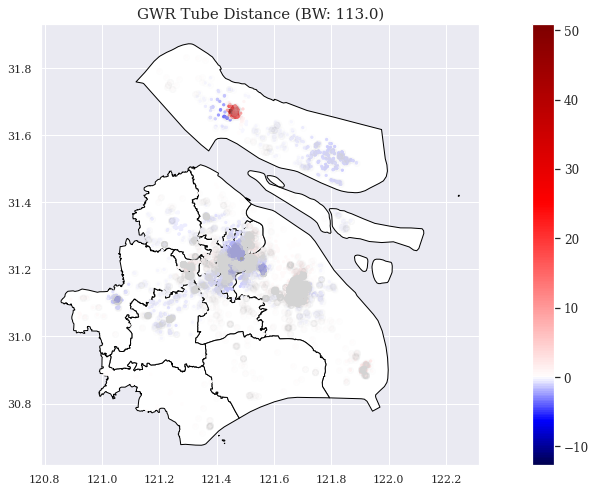

In [385]:
#Prep plot and add axis
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(15,7))
sssh.plot(ax=ax, edgecolor='black', facecolor='white', linewidth=1, figsize=(20,10))
ax.set_title('GWR Tube Distance (BW: ' + str(gwr_bw) +')', fontsize=15)

#Set color map
cmap = plt.cm.seismic

#Find min and max values of the combined dataset
gwr_min = df_gwr['gwr_x13_tube_dis'].min()
gwr_max = df_gwr['gwr_x13_tube_dis'].max()
vmin = np.min([gwr_min])
vmax = np.max([gwr_max])

#If all values are negative use the negative half of the colormap
if (vmin < 0) & (vmax < 0):
    cmap = truncate_colormap(cmap, 0.0, 0.5)
#If all values are positive use the positive half of the colormap
elif (vmin > 0) & (vmax > 0):
    cmap = truncate_colormap(cmap, 0.5, 1.0)
#Otherwise, there are positive and negative values so the colormap so zero is the midpoint
else:
    cmap = shift_colormap(cmap, start=0.0, midpoint=1 - vmax/(vmax + abs(vmin)), stop=1.)

#Create scalar mappable for colorbar and stretch colormap across range of data values
sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=vmin, vmax=vmax))

#Plot GWR parameters
df_gwr.plot('gwr_x13_tube_dis', cmap=sm.cmap, ax=ax, s=5, vmin=vmin, vmax=vmax, **{'alpha':1})
#If there are insignificnt parameters plot gray polygons over them
if (gwr_filtered_t[:,0] == 0).any():
    df_gwr[gwr_filtered_t[:,0] == 0].plot(color='lightgrey', ax=ax, **{'alpha':0.02})

#Set figure options and plot 
fig.tight_layout()    
sm._A = []
cbar = fig.colorbar(sm)
cbar.ax.tick_params(labelsize=12) 
ax.get_xaxis().set_visible(True)
ax.get_yaxis().set_visible(True)
plt.show()

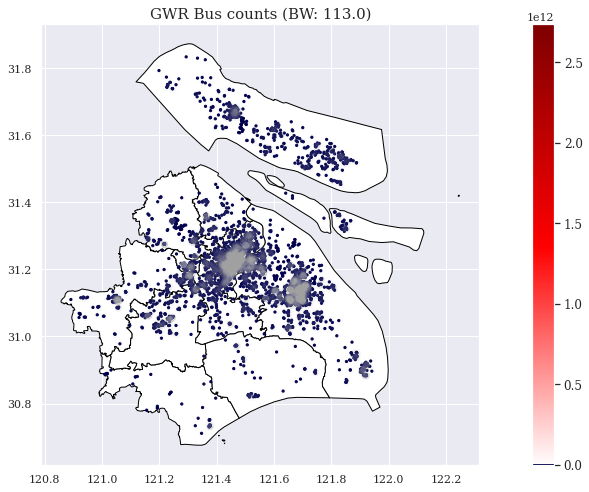

In [384]:
#Prep plot and add axis
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(15,7))
sssh.plot(ax=ax, edgecolor='black', facecolor='white', linewidth=1, figsize=(20,10))
ax.set_title('GWR Bus counts (BW: ' + str(gwr_bw) +')', fontsize=15)

#Set color map
cmap = plt.cm.seismic

#Find min and max values of the combined dataset
gwr_min = df_gwr['gwr_x14_bus_counts'].min()
gwr_max = df_gwr['gwr_x14_bus_counts'].max()
vmin = np.min([gwr_min])
vmax = np.max([gwr_max])

#If all values are negative use the negative half of the colormap
if (vmin < 0) & (vmax < 0):
    cmap = truncate_colormap(cmap, 0.0, 0.5)
#If all values are positive use the positive half of the colormap
elif (vmin > 0) & (vmax > 0):
    cmap = truncate_colormap(cmap, 0.5, 1.0)
#Otherwise, there are positive and negative values so the colormap so zero is the midpoint
else:
    cmap = shift_colormap(cmap, start=0.0, midpoint=1 - vmax/(vmax + abs(vmin)), stop=1.)

#Create scalar mappable for colorbar and stretch colormap across range of data values
sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=vmin, vmax=vmax))

#Plot GWR parameters
df_gwr.plot('gwr_x14_bus_counts', cmap=sm.cmap, ax=ax, s=5, vmin=vmin, vmax=vmax, **{'alpha':1})
#If there are insignificnt parameters plot gray polygons over them
if (gwr_filtered_t[:,0] == 0).any():
    df_gwr[gwr_filtered_t[:,0] == 0].plot(color='lightgrey', ax=ax, **{'alpha':0.02})

#Set figure options and plot 
fig.tight_layout()    
sm._A = []
cbar = fig.colorbar(sm)
cbar.ax.tick_params(labelsize=12) 
ax.get_xaxis().set_visible(True)
ax.get_yaxis().set_visible(True)
plt.show()

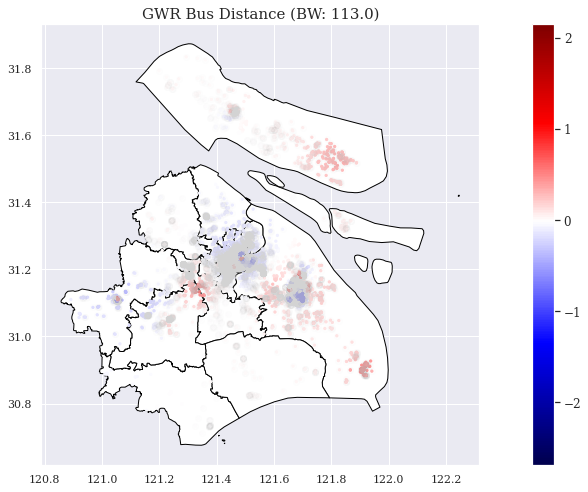

In [388]:
#Prep plot and add axis
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(15,7))
sssh.plot(ax=ax, edgecolor='black', facecolor='white', linewidth=1, figsize=(20,10))
ax.set_title('GWR Bus Distance (BW: ' + str(gwr_bw) +')', fontsize=15)

#Set color map
cmap = plt.cm.seismic

#Find min and max values of the combined dataset
gwr_min = df_gwr['gwr_x15_bus_dis'].min()
gwr_max = df_gwr['gwr_x15_bus_dis'].max()
vmin = np.min([gwr_min])
vmax = np.max([gwr_max])

#If all values are negative use the negative half of the colormap
if (vmin < 0) & (vmax < 0):
    cmap = truncate_colormap(cmap, 0.0, 0.5)
#If all values are positive use the positive half of the colormap
elif (vmin > 0) & (vmax > 0):
    cmap = truncate_colormap(cmap, 0.5, 1.0)
#Otherwise, there are positive and negative values so the colormap so zero is the midpoint
else:
    cmap = shift_colormap(cmap, start=0.0, midpoint=1 - vmax/(vmax + abs(vmin)), stop=1.)

#Create scalar mappable for colorbar and stretch colormap across range of data values
sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=vmin, vmax=vmax))

#Plot GWR parameters
df_gwr.plot('gwr_x15_bus_dis', cmap=sm.cmap, ax=ax, s=5, vmin=vmin, vmax=vmax, **{'alpha':1})
#If there are insignificnt parameters plot gray polygons over them
if (gwr_filtered_t[:,0] == 0).any():
    df_gwr[gwr_filtered_t[:,0] == 0].plot(color='lightgrey', ax=ax, **{'alpha':0.02})

#Set figure options and plot 
fig.tight_layout()    
sm._A = []
cbar = fig.colorbar(sm)
cbar.ax.tick_params(labelsize=12) 
ax.get_xaxis().set_visible(True)
ax.get_yaxis().set_visible(True)
plt.show()

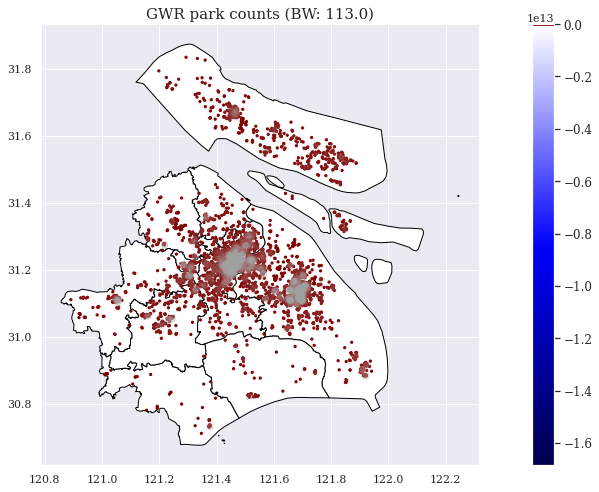

In [389]:
#Prep plot and add axis
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(15,7))
sssh.plot(ax=ax, edgecolor='black', facecolor='white', linewidth=1, figsize=(20,10))
ax.set_title('GWR park counts (BW: ' + str(gwr_bw) +')', fontsize=15)

#Set color map
cmap = plt.cm.seismic

#Find min and max values of the combined dataset
gwr_min = df_gwr['gwr_x16_park_counts'].min()
gwr_max = df_gwr['gwr_x16_park_counts'].max()
vmin = np.min([gwr_min])
vmax = np.max([gwr_max])

#If all values are negative use the negative half of the colormap
if (vmin < 0) & (vmax < 0):
    cmap = truncate_colormap(cmap, 0.0, 0.5)
#If all values are positive use the positive half of the colormap
elif (vmin > 0) & (vmax > 0):
    cmap = truncate_colormap(cmap, 0.5, 1.0)
#Otherwise, there are positive and negative values so the colormap so zero is the midpoint
else:
    cmap = shift_colormap(cmap, start=0.0, midpoint=1 - vmax/(vmax + abs(vmin)), stop=1.)

#Create scalar mappable for colorbar and stretch colormap across range of data values
sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=vmin, vmax=vmax))

#Plot GWR parameters
df_gwr.plot('gwr_x16_park_counts', cmap=sm.cmap, ax=ax, s=5, vmin=vmin, vmax=vmax, **{'alpha':1})
#If there are insignificnt parameters plot gray polygons over them
if (gwr_filtered_t[:,0] == 0).any():
    df_gwr[gwr_filtered_t[:,0] == 0].plot(color='lightgrey', ax=ax, **{'alpha':0.02})

#Set figure options and plot 
fig.tight_layout()    
sm._A = []
cbar = fig.colorbar(sm)
cbar.ax.tick_params(labelsize=12) 
ax.get_xaxis().set_visible(True)
ax.get_yaxis().set_visible(True)
plt.show()

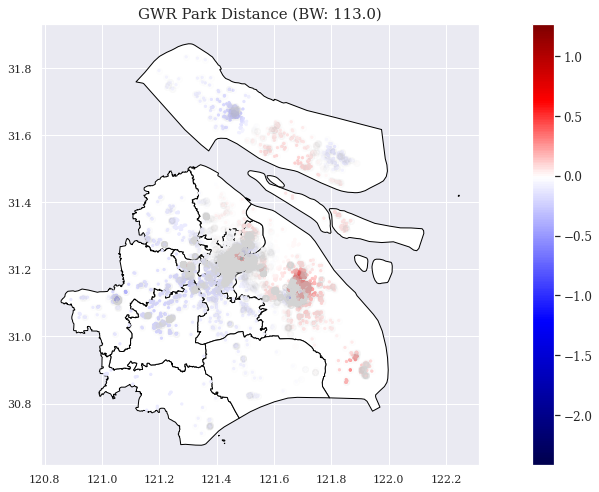

In [390]:
#Prep plot and add axis
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(15,7))
sssh.plot(ax=ax, edgecolor='black', facecolor='white', linewidth=1, figsize=(20,10))
ax.set_title('GWR Park Distance (BW: ' + str(gwr_bw) +')', fontsize=15)

#Set color map
cmap = plt.cm.seismic

#Find min and max values of the combined dataset
gwr_min = df_gwr['gwr_x17_park_dis'].min()
gwr_max = df_gwr['gwr_x17_park_dis'].max()
vmin = np.min([gwr_min])
vmax = np.max([gwr_max])

#If all values are negative use the negative half of the colormap
if (vmin < 0) & (vmax < 0):
    cmap = truncate_colormap(cmap, 0.0, 0.5)
#If all values are positive use the positive half of the colormap
elif (vmin > 0) & (vmax > 0):
    cmap = truncate_colormap(cmap, 0.5, 1.0)
#Otherwise, there are positive and negative values so the colormap so zero is the midpoint
else:
    cmap = shift_colormap(cmap, start=0.0, midpoint=1 - vmax/(vmax + abs(vmin)), stop=1.)

#Create scalar mappable for colorbar and stretch colormap across range of data values
sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=vmin, vmax=vmax))

#Plot GWR parameters
df_gwr.plot('gwr_x17_park_dis', cmap=sm.cmap, ax=ax, s=5, vmin=vmin, vmax=vmax, **{'alpha':1})
#If there are insignificnt parameters plot gray polygons over them
if (gwr_filtered_t[:,0] == 0).any():
    df_gwr[gwr_filtered_t[:,0] == 0].plot(color='lightgrey', ax=ax, **{'alpha':0.02})

#Set figure options and plot 
fig.tight_layout()    
sm._A = []
cbar = fig.colorbar(sm)
cbar.ax.tick_params(labelsize=12) 
ax.get_xaxis().set_visible(True)
ax.get_yaxis().set_visible(True)
plt.show()

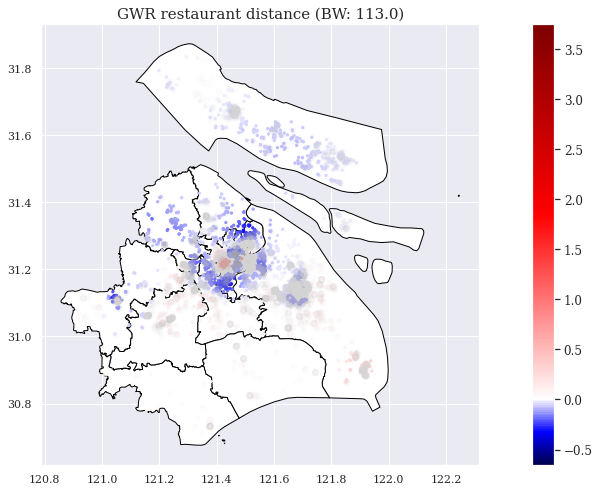

In [391]:
#Prep plot and add axis
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(15,7))
sssh.plot(ax=ax, edgecolor='black', facecolor='white', linewidth=1, figsize=(20,10))
ax.set_title('GWR restaurant distance (BW: ' + str(gwr_bw) +')', fontsize=15)

#Set color map
cmap = plt.cm.seismic

#Find min and max values of the combined dataset
gwr_min = df_gwr['gwr_x18_rest_dis'].min()
gwr_max = df_gwr['gwr_x18_rest_dis'].max()
vmin = np.min([gwr_min])
vmax = np.max([gwr_max])

#If all values are negative use the negative half of the colormap
if (vmin < 0) & (vmax < 0):
    cmap = truncate_colormap(cmap, 0.0, 0.5)
#If all values are positive use the positive half of the colormap
elif (vmin > 0) & (vmax > 0):
    cmap = truncate_colormap(cmap, 0.5, 1.0)
#Otherwise, there are positive and negative values so the colormap so zero is the midpoint
else:
    cmap = shift_colormap(cmap, start=0.0, midpoint=1 - vmax/(vmax + abs(vmin)), stop=1.)

#Create scalar mappable for colorbar and stretch colormap across range of data values
sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=vmin, vmax=vmax))

#Plot GWR parameters
df_gwr.plot('gwr_x18_rest_dis', cmap=sm.cmap, ax=ax, s=5, vmin=vmin, vmax=vmax, **{'alpha':1})
#If there are insignificnt parameters plot gray polygons over them
if (gwr_filtered_t[:,0] == 0).any():
    df_gwr[gwr_filtered_t[:,0] == 0].plot(color='lightgrey', ax=ax, **{'alpha':0.02})

#Set figure options and plot 
fig.tight_layout()    
sm._A = []
cbar = fig.colorbar(sm)
cbar.ax.tick_params(labelsize=12) 
ax.get_xaxis().set_visible(True)
ax.get_yaxis().set_visible(True)
plt.show()

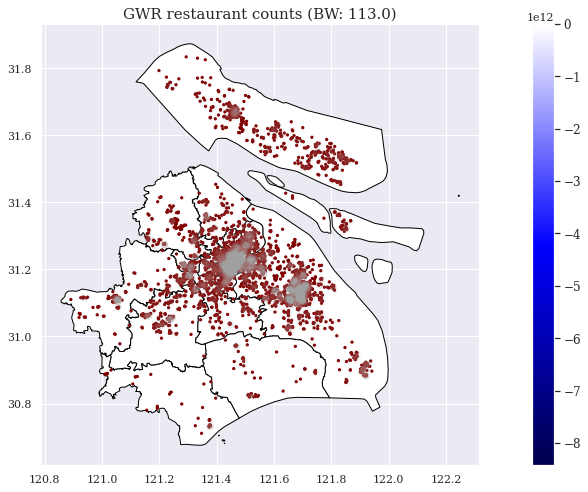

In [392]:
#Prep plot and add axis
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(15,7))
sssh.plot(ax=ax, edgecolor='black', facecolor='white', linewidth=1, figsize=(20,10))
ax.set_title('GWR restaurant counts (BW: ' + str(gwr_bw) +')', fontsize=15)

#Set color map
cmap = plt.cm.seismic

#Find min and max values of the combined dataset
gwr_min = df_gwr['gwr_x19_rest_counts'].min()
gwr_max = df_gwr['gwr_x19_rest_counts'].max()
vmin = np.min([gwr_min])
vmax = np.max([gwr_max])

#If all values are negative use the negative half of the colormap
if (vmin < 0) & (vmax < 0):
    cmap = truncate_colormap(cmap, 0.0, 0.5)
#If all values are positive use the positive half of the colormap
elif (vmin > 0) & (vmax > 0):
    cmap = truncate_colormap(cmap, 0.5, 1.0)
#Otherwise, there are positive and negative values so the colormap so zero is the midpoint
else:
    cmap = shift_colormap(cmap, start=0.0, midpoint=1 - vmax/(vmax + abs(vmin)), stop=1.)

#Create scalar mappable for colorbar and stretch colormap across range of data values
sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=vmin, vmax=vmax))

#Plot GWR parameters
df_gwr.plot('gwr_x19_rest_counts', cmap=sm.cmap, ax=ax, s=5, vmin=vmin, vmax=vmax, **{'alpha':1})
#If there are insignificnt parameters plot gray polygons over them
if (gwr_filtered_t[:,0] == 0).any():
    df_gwr[gwr_filtered_t[:,0] == 0].plot(color='lightgrey', ax=ax, **{'alpha':0.02})

#Set figure options and plot 
fig.tight_layout()    
sm._A = []
cbar = fig.colorbar(sm)
cbar.ax.tick_params(labelsize=12) 
ax.get_xaxis().set_visible(True)
ax.get_yaxis().set_visible(True)
plt.show()

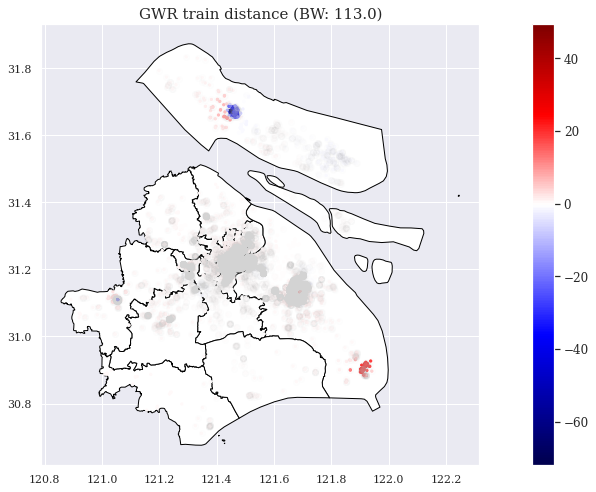

In [393]:
#Prep plot and add axis
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(15,7))
sssh.plot(ax=ax, edgecolor='black', facecolor='white', linewidth=1, figsize=(20,10))
ax.set_title('GWR train distance (BW: ' + str(gwr_bw) +')', fontsize=15)

#Set color map
cmap = plt.cm.seismic

#Find min and max values of the combined dataset
gwr_min = df_gwr['gwr_x20_train_dis'].min()
gwr_max = df_gwr['gwr_x20_train_dis'].max()
vmin = np.min([gwr_min])
vmax = np.max([gwr_max])

#If all values are negative use the negative half of the colormap
if (vmin < 0) & (vmax < 0):
    cmap = truncate_colormap(cmap, 0.0, 0.5)
#If all values are positive use the positive half of the colormap
elif (vmin > 0) & (vmax > 0):
    cmap = truncate_colormap(cmap, 0.5, 1.0)
#Otherwise, there are positive and negative values so the colormap so zero is the midpoint
else:
    cmap = shift_colormap(cmap, start=0.0, midpoint=1 - vmax/(vmax + abs(vmin)), stop=1.)

#Create scalar mappable for colorbar and stretch colormap across range of data values
sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=vmin, vmax=vmax))

#Plot GWR parameters
df_gwr.plot('gwr_x20_train_dis', cmap=sm.cmap, ax=ax, s=5, vmin=vmin, vmax=vmax, **{'alpha':1})
#If there are insignificnt parameters plot gray polygons over them
if (gwr_filtered_t[:,0] == 0).any():
    df_gwr[gwr_filtered_t[:,0] == 0].plot(color='lightgrey', ax=ax, **{'alpha':0.02})

#Set figure options and plot 
fig.tight_layout()    
sm._A = []
cbar = fig.colorbar(sm)
cbar.ax.tick_params(labelsize=12) 
ax.get_xaxis().set_visible(True)
ax.get_yaxis().set_visible(True)
plt.show()

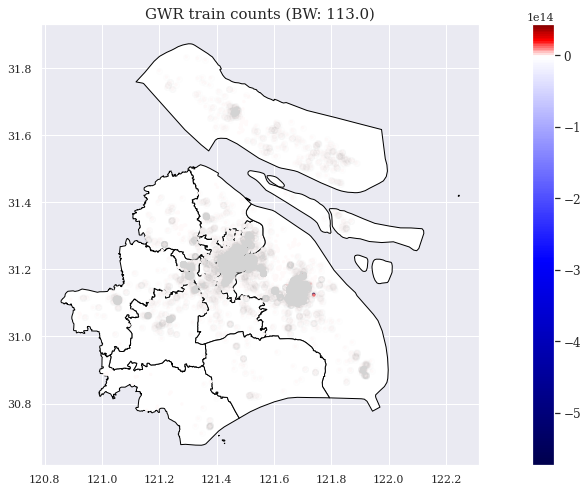

In [394]:
#Prep plot and add axis
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(15,7))
sssh.plot(ax=ax, edgecolor='black', facecolor='white', linewidth=1, figsize=(20,10))
ax.set_title('GWR train counts (BW: ' + str(gwr_bw) +')', fontsize=15)

#Set color map
cmap = plt.cm.seismic

#Find min and max values of the combined dataset
gwr_min = df_gwr['gwr_x21_train_counts'].min()
gwr_max = df_gwr['gwr_x21_train_counts'].max()
vmin = np.min([gwr_min])
vmax = np.max([gwr_max])

#If all values are negative use the negative half of the colormap
if (vmin < 0) & (vmax < 0):
    cmap = truncate_colormap(cmap, 0.0, 0.5)
#If all values are positive use the positive half of the colormap
elif (vmin > 0) & (vmax > 0):
    cmap = truncate_colormap(cmap, 0.5, 1.0)
#Otherwise, there are positive and negative values so the colormap so zero is the midpoint
else:
    cmap = shift_colormap(cmap, start=0.0, midpoint=1 - vmax/(vmax + abs(vmin)), stop=1.)

#Create scalar mappable for colorbar and stretch colormap across range of data values
sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=vmin, vmax=vmax))

#Plot GWR parameters
df_gwr.plot('gwr_x21_train_counts', cmap=sm.cmap, ax=ax, s=5, vmin=vmin, vmax=vmax, **{'alpha':1})
#If there are insignificnt parameters plot gray polygons over them
if (gwr_filtered_t[:,0] == 0).any():
    df_gwr[gwr_filtered_t[:,0] == 0].plot(color='lightgrey', ax=ax, **{'alpha':0.02})

#Set figure options and plot 
fig.tight_layout()    
sm._A = []
cbar = fig.colorbar(sm)
cbar.ax.tick_params(labelsize=12) 
ax.get_xaxis().set_visible(True)
ax.get_yaxis().set_visible(True)
plt.show()

### Spliting Data Using LASSO to drop multicollinearity? - and using random forest or other method?

In [ ]:
from sklearn.model_selection import train_test_split

In [ ]:
random_state_split = 100
train_x, test_x, train_y, test_y = train_test_split(df_final1.drop(['log_price'], axis = 1), df_final1['log_price'], random_state=random_state_split)

In [ ]:
print(train_x.shape) #105 rows, 8 columns
print(train_y.shape) #105 rows, 1 column
print(test_x.shape) # 36 rows, 8 coloums
print(test_y.shape) # 36 rows, 1 coloums

# check the index of train_x and train_y
print(train_x.index.identical(train_y.index))
print(test_x.index.identical(test_y.index))

#### LASSO

In [ ]:
lasso_model = sklearn.linear_model.Lasso(max_iter=10e7, normalize=True)
lasso_model.fit(X=train_x, y=train_y)

In [ ]:
# the R2 value
lasso_model.score(X=train_x, y=train_y)

In [ ]:
df_coef_lasso = pd.DataFrame({"var": train_x.columns.values, "coef":lasso_model.coef_})
print(df_coef_lasso)

In [ ]:
from itertools import cycle
from sklearn.linear_model import lasso_path

train_x_standard = train_x/train_x.std(axis=0)
list_alphas = [.1, .5, 1, 10, 100, 1000, 10000]

alphas_lasso, coefs_lasso, _ = lasso_path(train_x_standard, train_y.values.reshape(-1),alphas = list_alphas, fit_intercept=False)

log_alphas_lasso = np.log10(alphas_lasso)
for coef_l in coefs_lasso:
    l1 = plt.plot(log_alphas_lasso, coef_l)

plt.xlabel('Log(alpha)')
plt.ylabel('coefficients')
plt.title('Lasso Path')
plt.axis('tight')

In [ ]:
from sklearn.linear_model import LassoCV
import time

#set cv and alphas what to be test
start_time = time.time()
lasso_cv = LassoCV(cv=20, alphas=list_alphas).fit(train_x, train_y)
fit_time = time.time() - start_time

In [ ]:
import matplotlib.pyplot as plt

ymin, ymax = np.min(lasso_cv.mse_path_), np.max(lasso_cv.mse_path_)
# lasso = model[-1]
plt.semilogx(lasso_cv.alphas_, lasso_cv.mse_path_, linestyle=":")
plt.plot(
    lasso_cv.alphas_,
    lasso_cv.mse_path_.mean(axis=-1),
    color="black",
    label="Average across the folds",
    linewidth=2,
)
plt.axvline(lasso_cv.alpha_, linestyle="--", color="black", label="alpha: CV estimate")

plt.ylim(ymin, ymax)
plt.xlabel(r"$\alpha$")
plt.ylabel("Mean square error")
plt.legend()
_ = plt.title(
    f"Mean square error on each fold: coordinate descent (train time: {fit_time:.2f}s)"
)


In [ ]:
print(lasso_cv.alphas_)

In [ ]:
print(lasso_cv.alpha_)

In [ ]:
# increase the max_iter to guarantee convergence
# rerun the model using the optimal alpha value, 上面那个1.0
lasso_model = sklearn.linear_model.Lasso(max_iter=10e7, normalize=True, alpha = lasso_cv.alpha_)
lasso_model.fit(X=train_x, y=train_y)
print(lasso_model.score(train_x, train_y))

In [ ]:
print(lasso_model.score(test_x, test_y))